In [1]:
# DASK client set

import os
import sys
from dask.distributed import Client
# client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler.json', threads_per_worker=2, n_workers=6)
# client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler.json')
client = Client(scheduler_file='/proj/kimyy/Dropbox/source/python/all/mpi/scheduler_10.json')  

# add private module path for workers
# client.run(lambda: os.environ.update({'PYTHONPATH': '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2'}))
# def add_path():
#     if '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2' not in sys.path:
#         sys.path.append('/proj/kimyy/Dropbox/source/python/all/Modules/CESM2')

# client.run(add_path)

def setup_module_path():
    module_path = '/proj/kimyy/Dropbox/source/python/all/Modules/CESM2'
    if module_path not in sys.path:
        sys.path.append(module_path)

client.run(setup_module_path)

client

# get path for path changes in Jupyter notebook: File - Open from Path - insert relative_path
notebook_path = os.path.abspath(".")
_, _, relative_path = notebook_path.partition('/all/')
relative_path = '/all/' + relative_path
relative_path

'/all/Model/CESM2/Earth_System_Predictability/ASSM/Aleph'

# Load modules

In [2]:
# load public modules

import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as patches
import matplotlib.ticker as mticker
import matplotlib.path as mpath
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from scipy import stats
from scipy.interpolate import griddata
import cmocean
from cmcrameri import cm
import warnings
warnings.simplefilter(action='ignore')
import pandas as pd
import cftime
import pop_tools
from pprint import pprint
import time
import subprocess
import re as re_mod
import cftime
import datetime
from scipy.stats import ttest_1samp

In [3]:
# load private modules

import sys
sys.path.append('/proj/kimyy/Dropbox/source/python/all/Modules/CESM2')
from KYY_CESM2_preprocessing import CESM2_config
# import KYY_CESM2_preprocessing
# import importlib
# importlib.reload(KYY_CESM2_preprocessing)

# Variable configuration

In [4]:
cfg_var=CESM2_config()
cfg_var.year_s=1960
cfg_var.year_e=2020

cfg_var.setvar('DpCO2')
cfg_var.list()

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

{'codebase': 'e21',
 'comp': 'ocn',
 'compset': 'b',
 'dimension': 'time '
              'nlat '
              'nlon',
 'long_name': 'D '
              'pCO2',
 'model': 'pop.h',
 'ndim': 3,
 'resol': 'f09_g17',
 'tfreq': 'month_1',
 'unit': 'ppmv',
 'var': 'DpCO2',
 'year_e': 2020,
 'year_s': 1960}


# Read dataset

In [5]:
# define preprocessing function

exceptcv=['time','lon','lat','lev', 'TLONG', 'TLAT', 'z_w', cfg_var.var]
def process_coords(ds, sd, ed, drop=True, except_coord_vars=exceptcv):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    
    if drop:
        ds= ds.drop(coord_vars)
        ds= ds.sel(time=slice(sd, ed))
        return ds
    else:
        return ds.set_coords(coord_vars)


start_date = cftime.DatetimeNoLeap(cfg_var.year_s, 2, 1)
end_date = cftime.DatetimeNoLeap(cfg_var.year_e+1, 1, 1)


def process_coords_hcst(ds, drop=True, except_coord_vars=['time','lon','lat', 'TLONG', 'TLAT', cfg_var.var]):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    
    if drop:
        ds= ds.drop(coord_vars)
        return ds
    else:
        return ds.set_coords(coord_vars)


def process_coords_obs(ds, drop=True, except_coord_vars=['time','lon','lat', 'TLONG', 'TLAT', 'dco2']):
    """Preprocessor function to drop all non-dim coords, which slows down concatenation."""
    coord_vars = []
    for v in np.array(ds.coords) :
        if not v in except_coord_vars:
            coord_vars += [v]
    for v in np.array(ds.data_vars) :
        if not v in except_coord_vars:
            coord_vars += [v]
    
    if drop:
        ds= ds.drop(coord_vars)
        return ds
    else:
        return ds.set_coords(coord_vars)

In [6]:
# Read Hindcast dataset
start_time = time.time()

cfg_var.HCST_path_load(cfg_var.var)

cfg_var.HCST_ds = []
for iyear in range(0, len(cfg_var.HCST_file_list)):
    HCST_ds_tmp = xr.open_mfdataset(cfg_var.HCST_file_list[iyear], 
                           chunks={'time': 12}, 
                           combine='nested',
                           concat_dim=[[*cfg_var.HCST_ensembles]], 
                           parallel=True,
                           preprocess=lambda ds: process_coords_hcst(ds),
                           decode_cf=True, 
                           decode_times=True)
    HCST_ds_tmp['time_values'] = HCST_ds_tmp['time'].values
    HCST_ds_tmp = HCST_ds_tmp.rename({"time": "lmonths"})
    HCST_ds_tmp['lmonths']=range(1,61)
    HCST_ds_tmp = HCST_ds_tmp.assign(time_values=("lmonths", HCST_ds_tmp['time_values'].values))  # time 값을 lmonths 차원과 연결

    HCST_ds_tmp
    
    HCST_ds_a= []
    HCST_ds_a.append(HCST_ds_tmp)
    HCST_ds_xr = xr.concat(HCST_ds_a, dim='lmonths')
    HCST_ds_xr = HCST_ds_xr.expand_dims({'iyear': 1})
    
    cfg_var.HCST_ds.append(HCST_ds_xr)

cfg_var.HCST_ds = xr.concat(cfg_var.HCST_ds, dim='iyear')
cfg_var.HCST_ds = cfg_var.HCST_ds.rename({"concat_dim": "ens_HCST"})
cfg_var.HCST_ds['iyear']=range(cfg_var.year_s, cfg_var.year_e+1)

# time_values의 차원에 맞는 timedelta 배열 생성
timedelta_array = np.full(cfg_var.HCST_ds.time_values.shape, datetime.timedelta(days=15))
# time_values에서 15일을 뺀 새로운 time_values 생성
new_time = cfg_var.HCST_ds.time_values - timedelta_array
# 새로운 time_values로 업데이트
cfg_var.HCST_ds = cfg_var.HCST_ds.assign(time_values=new_time)

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading HCST: ' + str(elapsed_time))

elasped time for reading HCST: 280.8165376186371


In [7]:
# Read LE dataset

start_time = time.time()


cfg_var.LE_path_load(cfg_var.var)
cfg_var.LE_ds = xr.open_mfdataset(cfg_var.LE_file_list[0], 
                       chunks={'time': 12}, 
                       combine='nested', 
                       concat_dim=[[*cfg_var.LE_ensembles], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords(ds, start_date, end_date),
                       decode_cf=True, 
                       decode_times=True)      


cfg_var.LE_ds = cfg_var.LE_ds.rename({"concat_dim": "ens_LE"})
new_time = cfg_var.LE_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.LE_ds.time))
cfg_var.LE_ds = cfg_var.LE_ds.assign_coords(time=new_time)

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading LE: ' + str(elapsed_time))

elasped time for reading LE: 120.59078168869019


In [8]:
# Read ODA dataset (all)

start_time = time.time()

cfg_var.ODA_path_load(cfg_var.var)

ODA_ds = xr.open_mfdataset(cfg_var.ODA_file_list[0][0:10],
                           chunks={'time': 12}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var.ODA_ensembles[0:10]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date),
                           decode_cf=True, 
                           decode_times=True)

ODA_ds2 = xr.open_mfdataset(cfg_var.ODA_file_list[0][10:20], 
                           chunks={'time': 12}, 
                           combine='nested', 
                           concat_dim=[[*cfg_var.ODA_ensembles[10:20]], 'time'], 
                           parallel=True,
                           preprocess=lambda ds: process_coords(ds, start_date, end_date),
                           decode_cf=True, 
                           decode_times=True)

# en4.2 -> until 2021; projdv7.3 -> until 2020; need to be read separately
ODA_ds_a = []
ODA_ds_a.append(ODA_ds)
ODA_ds_xr = xr.concat(ODA_ds_a, dim='time')
ODA_ds_xr = ODA_ds_xr.expand_dims({'ens': range(10)})

ODA_ds2_a = []
ODA_ds2_a.append(ODA_ds2)
ODA_ds2_xr = xr.concat(ODA_ds2_a, dim='time')
ODA_ds2_xr = ODA_ds2_xr.expand_dims({'ens': range(10, 20)})

cfg_var.ODA_ds = []
cfg_var.ODA_ds.append(ODA_ds_xr)
cfg_var.ODA_ds.append(ODA_ds2_xr)
cfg_var.ODA_ds = xr.concat(cfg_var.ODA_ds, dim='ens')
cfg_var.ODA_ds = cfg_var.ODA_ds.reindex(ens=list(range(1, 20+1)))
cfg_var.ODA_ds = cfg_var.ODA_ds.sortby('time')

cfg_var.ODA_ds = cfg_var.ODA_ds.rename({"concat_dim": "ens_ODA"})
new_time = cfg_var.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.ODA_ds.time))
cfg_var.ODA_ds = cfg_var.ODA_ds.assign_coords(time=new_time)
cfg_var.ODA_ds = cfg_var.ODA_ds.drop('ens')
cfg_var.ODA_ds=cfg_var.ODA_ds.mean(dim='ens')
end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ODA: ' + str(elapsed_time))

elasped time for reading ODA: 87.9642686843872


In [9]:
#Read ADA dataset
start_time = time.time()

cfg_var.ADA_path_load(cfg_var.var)
cfg_var.ADA_ds = xr.open_mfdataset(cfg_var.ADA_file_list[0], 
                       chunks={'time': 12}, 
                       combine='nested',
                       concat_dim=[[*cfg_var.ADA_ensembles], 'time'], 
                       parallel=True,
                       preprocess=lambda ds: process_coords(ds, start_date, end_date),
                       decode_cf=True, 
                       decode_times=True)      


cfg_var.ADA_ds = cfg_var.ADA_ds.rename({"concat_dim": "ens_ADA"})
new_time = cfg_var.ADA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.ADA_ds.time))
cfg_var.ADA_ds = cfg_var.ADA_ds.assign_coords(time=new_time)

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading ADA: ' + str(elapsed_time))

elasped time for reading ADA: 33.58167576789856


In [10]:
# # Read ODA dataset (projd only)
# start_time = time.time()

# cfg_var.ODA_path_load(cfg_var.var)

# cfg_var.ODA_ds = xr.open_mfdataset(cfg_var.ODA_file_list[0][10:20], 
#                            chunks={'time': 2}, 
#                            combine='nested', 
#                            concat_dim=[[*cfg_var.ODA_ensembles[10:20]], 'time'], 
#                            parallel=True,
#                            preprocess=lambda ds: process_coords(ds, start_date, end_date),
#                            decode_cf=True, 
#                            decode_times=True)

# cfg_var.ODA_ds = cfg_var.ODA_ds.rename({"concat_dim": "ens_ODA"})
# new_time = cfg_var.ODA_ds.time - np.array([datetime.timedelta(days=15)] * len(cfg_var.ODA_ds.time))
# cfg_var.ODA_ds = cfg_var.ODA_ds.assign_coords(time=new_time)

# end_time = time.time()
# elapsed_time = end_time - start_time
# print('elasped time for reading ODA: ' + str(elapsed_time))

In [11]:
# Read Observation dataset
start_time = time.time()

cfg_var.OBS_path_load(cfg_var.var)
# cfg_var.OBS_ds = xr.open_mfdataset(cfg_var.OBS_file_list[0][0], 
#                        combine='nested',
#                        concat_dim= 'time',
#                        chunks={'time': 6}, 
#                        parallel=True,
#                        preprocess=lambda ds: process_coords(ds, start_date, end_date),
#                        decode_cf=True, 
#                        decode_times=True,
#                        engine='h5netcdf')
# cfg_var.OBS_ds = xr.open_mfdataset(cfg_var.OBS_file_list[0][0], 
#                        chunks={'time': 12}, 
#                        parallel=True,
#                        preprocess=lambda ds: process_coords_obs(ds),
#                        decode_cf=True, 
#                        decode_times=True,)
cfg_var.OBS_ds = xr.open_mfdataset(cfg_var.OBS_file_list[0][0], 
                       chunks={'time': 12}, 
                       parallel=True,
                       preprocess=lambda ds: process_coords_obs(ds),
                       decode_cf=True,)

cfg_var.OBS_ds = cfg_var.OBS_ds.rename({cfg_var.OBS_var: cfg_var.var})

# new_time = cfg_var.OBS_ds.time + np.array([datetime.timedelta(days=15)] * len(cfg_var.OBS_ds.time))
# cfg_var.OBS_ds = cfg_var.OBS_ds.assign_coords(time=new_time)

if cfg_var.var=='SSH':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[396:732])
elif cfg_var.var=='photoC_TOT_zint_100m':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[456:732])
elif cfg_var.var=='FG_CO2':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[264:732])
elif cfg_var.var=='DpCO2_ALT_CO2':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[264:732])
elif cfg_var.var=='DpCO2':
    cfg_var.OBS_ds=cfg_var.OBS_ds.assign_coords(time=cfg_var.ODA_ds.time[264:732])
cfg_var.OBS_ds.time

# global mean removal for SSH
if cfg_var.var=='SSH':
    lat_mask = (ds_grid.TLAT >= -60) & (ds_grid.TLAT <= 60)

    area_selected = ds_grid.TAREA.where(lat_mask, drop=True)  # 선택된 지역의 면적
    ssh_selected = cfg_var.OBS_ds[cfg_var.var].where(lat_mask, drop=True)  # 선택된 지역의 SSH 데이터

    # 필터링된 지역에 대해 global mean 계산
    cfg_var.OBS_ds['gm'] = (ssh_selected * area_selected).sum(dim=['nlat', 'nlon']) / area_selected.sum(dim=['nlat', 'nlon'])
    
    # 원 데이터에서 global mean을 제거한 값
    cfg_var.OBS_ds['SSH'] = cfg_var.OBS_ds[cfg_var.var] - cfg_var.OBS_ds['gm']
elif cfg_var.var=='DpCO2_ALT_CO2':
    lat_mask = (ds_grid.TLAT >= -90) & (ds_grid.TLAT <= 90)

    area_selected = ds_grid.TAREA.where(lat_mask, drop=True)  # 선택된 지역의 면적
    ssh_selected = cfg_var.OBS_ds[cfg_var.var].where(lat_mask, drop=True)  # 선택된 지역의 SSH 데이터

    # 필터링된 지역에 대해 global mean 계산
    cfg_var.OBS_ds['gm'] = (ssh_selected * area_selected).sum(dim=['nlat', 'nlon']) / area_selected.sum(dim=['nlat', 'nlon'])
    
    # 원 데이터에서 global mean을 제거한 값
    cfg_var.OBS_ds['DpCO2_ALT_CO2'] = cfg_var.OBS_ds[cfg_var.var] - cfg_var.OBS_ds['gm']

# Step 1: 결측값이 아닌 값의 비율 계산
# 결측값이 아닌 값들에 대해 True, 결측값에 대해 False로 표시
valid_data_count = (~cfg_var.OBS_ds[cfg_var.var].isnull()).sum(dim='time')
# Step 2: 전체 시간 축의 길이 (즉, 데이터가 있어야 할 총 시간 개수)
total_time_steps = cfg_var.OBS_ds['time'].size
# Step 3: 80% 이상의 값이 있는지 계산
# 비율 계산 후, 80% 이상이면 True, 그렇지 않으면 False로 표시
threshold = 0.8
mask = (valid_data_count / total_time_steps) >= threshold
# Step 4: 마스크 변수를 데이터셋에 추가
cfg_var.OBS_ds['mask_80_percent'] = mask
cfg_var.OBS_ds['mask_80_percent'].compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for reading OBS: ' + str(elapsed_time))

elasped time for reading OBS: 54.10435461997986


In [12]:
cfg_var.OBS_ds['time'].size

468

# Take annual means

In [13]:
# obs_non_nan_times = cfg_var.OBS_ds.notnull()
# ada_filtered = cfg_var.ADA_ds.sel(time=obs_non_nan_times)

# Step 1: OBS_ds에서 NaN이 아닌 시간대에 해당하는 boolean mask 생성
obs_non_nan_times = cfg_var.OBS_ds[cfg_var.var].notnull().any(dim=['nlat', 'nlon'])
# Step 2: boolean mask를 명시적으로 계산 (compute() 호출)
obs_non_nan_times = obs_non_nan_times.compute()
# Step 3: NaN이 아닌 시간대에 해당하는 time 좌표 추출
non_nan_time_coords = cfg_var.OBS_ds.time.where(obs_non_nan_times, drop=True)
# Step 4: ADA_ds에서 NaN이 아닌 시간대에 해당하는 자료만 선택
oda_filtered = cfg_var.ODA_ds.sel(time=non_nan_time_coords)
le_filtered = cfg_var.LE_ds.sel(time=non_nan_time_coords)
ada_filtered = cfg_var.ADA_ds.sel(time=non_nan_time_coords)

# Step 5: 연도별로 그룹화하고 NaN을 무시한 연평균 계산
ada_annual_mean = ada_filtered.groupby('time.year').mean(dim='time', skipna=True)
oda_annual_mean = oda_filtered.groupby('time.year').mean(dim='time', skipna=True)
le_annual_mean = le_filtered.groupby('time.year').mean(dim='time', skipna=True)
obs_annual_mean = cfg_var.OBS_ds.groupby('time.year').mean(dim='time', skipna=True)

oda_full_annual_mean = cfg_var.ODA_ds.groupby('time.year').mean(dim='time', skipna=True)
le_full_annual_mean = cfg_var.LE_ds.groupby('time.year').mean(dim='time', skipna=True)
ada_full_annual_mean = cfg_var.ADA_ds.groupby('time.year').mean(dim='time', skipna=True)

ref_time=cfg_var.ODA_ds.time.groupby('time.year').mean(dim='time')

In [14]:
# 4 year moving average
oda_rolling_mean = oda_annual_mean.rolling(year=4, min_periods=4).mean()
oda_rolling_time_mean = oda_annual_mean['year'].rolling(year=4, min_periods=4).mean()
oda_rolling_mean = oda_rolling_mean.assign_coords(year=oda_rolling_time_mean)
valid_index = np.where(~np.isnan(oda_rolling_mean['year']))[0]
oda_rolling_mean = oda_rolling_mean.isel(year=valid_index)

ada_rolling_mean = ada_annual_mean.rolling(year=4, min_periods=4).mean()
ada_rolling_time_mean = ada_annual_mean['year'].rolling(year=4, min_periods=4).mean()
ada_rolling_mean = ada_rolling_mean.assign_coords(year=ada_rolling_time_mean)
valid_index = np.where(~np.isnan(ada_rolling_mean['year']))[0]
ada_rolling_mean = ada_rolling_mean.isel(year=valid_index)

le_rolling_mean = le_annual_mean.rolling(year=4, min_periods=4).mean()
le_rolling_time_mean = le_annual_mean['year'].rolling(year=4, min_periods=4).mean()
le_rolling_mean = le_rolling_mean.assign_coords(year=le_rolling_time_mean)
valid_index = np.where(~np.isnan(le_rolling_mean['year']))[0]
le_rolling_mean = le_rolling_mean.isel(year=valid_index)

obs_rolling_mean = obs_annual_mean.rolling(year=4, min_periods=4).mean()
obs_rolling_time_mean = obs_annual_mean['year'].rolling(year=4, min_periods=4).mean()
obs_rolling_mean = obs_rolling_mean.assign_coords(year=obs_rolling_time_mean)
valid_index = np.where(~np.isnan(obs_rolling_mean['year']))[0]
obs_rolling_mean = obs_rolling_mean.isel(year=valid_index)

oda_full_rolling_mean = oda_full_annual_mean.rolling(year=4, min_periods=4).mean()
oda_full_rolling_time_mean = oda_full_annual_mean['year'].rolling(year=4, min_periods=4).mean()
oda_full_rolling_mean = oda_full_rolling_mean.assign_coords(year=oda_full_rolling_time_mean)
valid_index = np.where(~np.isnan(oda_full_rolling_mean['year']))[0]
oda_full_rolling_mean = oda_full_rolling_mean.isel(year=valid_index)

ada_full_rolling_mean = ada_full_annual_mean.rolling(year=4, min_periods=4).mean()
ada_full_rolling_time_mean = ada_full_annual_mean['year'].rolling(year=4, min_periods=4).mean()
ada_full_rolling_mean = ada_full_rolling_mean.assign_coords(year=ada_full_rolling_time_mean)
valid_index = np.where(~np.isnan(ada_full_rolling_mean['year']))[0]
ada_full_rolling_mean = ada_full_rolling_mean.isel(year=valid_index)

le_full_rolling_mean = le_full_annual_mean.rolling(year=4, min_periods=4).mean()
le_full_rolling_time_mean = le_full_annual_mean['year'].rolling(year=4, min_periods=4).mean()
le_full_rolling_mean = le_full_rolling_mean.assign_coords(year=le_full_rolling_time_mean)
valid_index = np.where(~np.isnan(le_full_rolling_mean['year']))[0]
le_full_rolling_mean = le_full_rolling_mean.isel(year=valid_index)

In [15]:
hcst_annual_mean = cfg_var.HCST_ds.groupby((cfg_var.HCST_ds.lmonths - 1) // 12).mean(dim='lmonths')
# 새로운 차원 이름을 원하는 대로 수정 (여기서는 'year')
hcst_annual_mean = hcst_annual_mean.rename({'lmonths': 'lyear'})

In [16]:
hcst_ly1_annual_mean = hcst_annual_mean[cfg_var.var].isel(lyear=0)
hcst_ly1_annual_mean = hcst_ly1_annual_mean.rename({'iyear': 'year'})
hcst_ly1_annual_mean= hcst_ly1_annual_mean.assign_coords(year=ref_time.year)
hcst_full_ly1_annual_mean = hcst_ly1_annual_mean
hcst_ly1_annual_mean = hcst_ly1_annual_mean.sel(year=obs_annual_mean.year)

In [17]:

hcst_ly2_5_annual_mean = hcst_annual_mean[cfg_var.var].isel(lyear=slice(1, 5)) # except of 0, 1:4 is selected
hcst_ly2_5_annual_mean=hcst_ly2_5_annual_mean.mean(dim='lyear')
hcst_ly2_5_annual_mean = hcst_ly2_5_annual_mean.rename({'iyear': 'year'})
hcst_ly2_5_annual_mean= hcst_ly2_5_annual_mean.assign_coords(year=ref_time.year + (1+4)/2)
hcst_full_ly2_5_annual_mean = hcst_ly2_5_annual_mean
hcst_ly2_5_annual_mean = hcst_ly2_5_annual_mean.sel(year=obs_rolling_mean.year)


In [18]:
# take ensemble mean, for increments (ODA-LE, HCST-LE)

oda_annual_mean['enm']=oda_annual_mean[cfg_var.var].mean(dim='ens_ODA')
le_annual_mean['enm']=le_annual_mean[cfg_var.var].mean(dim='ens_LE')
# hcst_annual_mean['enm']=hcst_ly1_annual_mean.mean(dim='ens_HCST')

oda_full_annual_mean['enm']=oda_full_annual_mean[cfg_var.var].mean(dim='ens_ODA')
le_full_annual_mean['enm']=le_full_annual_mean[cfg_var.var].mean(dim='ens_LE')

oda_annual_mean['diff_le']=oda_annual_mean[cfg_var.var] - le_annual_mean.enm
ada_annual_mean['diff_le']=ada_annual_mean[cfg_var.var] - le_annual_mean.enm
ada_annual_mean['diff_oda']=ada_annual_mean[cfg_var.var] - oda_annual_mean.enm

oda_full_annual_mean['diff_le']=oda_full_annual_mean[cfg_var.var] - le_full_annual_mean.enm
ada_full_annual_mean['diff_le']=ada_full_annual_mean[cfg_var.var] - le_full_annual_mean.enm
ada_full_annual_mean['diff_oda']=ada_full_annual_mean[cfg_var.var] - oda_full_annual_mean.enm

In [19]:
start_time = time.time()

corr_ODA_diff = xr.corr(oda_annual_mean.diff_le, getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
corr_ADA_diff_le = xr.corr(ada_annual_mean.diff_le, getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
corr_ADA_diff_oda = xr.corr(ada_annual_mean.diff_oda, getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
# corr_LE = xr.corr(le_annual_mean[cfg_var.var], getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
# corr_ODA = xr.corr(oda_annual_mean[cfg_var.var], getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
corr_HCST = xr.corr(hcst_ly1_annual_mean, getattr(obs_annual_mean,cfg_var.var), dim='year').compute()
corr_HCST_ly2_5 = xr.corr(hcst_ly2_5_annual_mean, getattr(obs_rolling_mean,cfg_var.var), dim='year').compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

elasped time for calculating correlation: 498.91006445884705


In [20]:
start_time = time.time()

pp_HCST = xr.corr(hcst_full_ly1_annual_mean, oda_full_annual_mean[cfg_var.var], dim='year').compute()

common_years = np.intersect1d(hcst_full_ly2_5_annual_mean['year'], oda_full_rolling_mean['year'])
pp_HCST_ly2_5 = xr.corr(
    hcst_full_ly2_5_annual_mean.sel(year=common_years),
    oda_full_rolling_mean[cfg_var.var].sel(year=common_years),
    dim='year'
).compute()

# pp_HCST_ly2_5 = xr.corr(hcst_full_ly2_5_annual_mean, oda_full_rolling_mean[cfg_var.var], dim='year').compute()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for calculating correlation: ' + str(elapsed_time))

elasped time for calculating correlation: 650.291074514389


In [21]:
def pop_add_cyclic(da):
        #copied from Mattew Longs github (https://gist.github.com/matt-long/50433da346da8ac17cde926eec90a87c) and modified for DA
        #This doesn't work with Dask (DA should be loaded)
        #Input DA must have the name and coords (TLONG and TLAT), and don't have other dims (time etc.)
        #Output is DA
        nj = da.TLAT.shape[0]
        ni = da.TLONG.shape[1]
        xL = int(ni/2 - 1)
        xR = int(xL + ni)
        tlon = da.TLONG.data
        tlat = da.TLAT.data
        tlon = np.where(np.greater_equal(tlon, min(tlon[:,0])), tlon-360., tlon)
        lon  = np.concatenate((tlon, tlon + 360.), 1)
        lon = lon[:, xL:xR]
        if ni == 320:
            lon[367:-3, 0] = lon[367:-3, 0] + 360.
        lon = lon - 360.
        lon = np.hstack((lon, lon[:, 0:1] + 360.))
        if ni == 320:
            lon[367:, -1] = lon[367:, -1] - 360.
        #-- trick cartopy into doing the right thing:
        #   it gets confused when the cyclic coords are identical
        lon[:, 0] = lon[:, 0] - 1e-8
        #-- periodicity
        lat = np.concatenate((tlat, tlat), 1)
        lat = lat[:, xL:xR]
        lat = np.hstack((lat, lat[:,0:1]))
        TLAT = xr.DataArray(lat, dims=('nlat', 'nlon'))
        TLONG = xr.DataArray(lon, dims=('nlat', 'nlon'))
        # copy vars
        v = da.name
        v_dims = da.dims
        # determine and sort other dimensions
        other_dims = set(v_dims) - {'nlat', 'nlon'}
        other_dims = tuple([d for d in v_dims if d in other_dims])
        lon_dim = da.dims.index('nlon')
        field = da.data
        field = np.concatenate((field, field), lon_dim)
        field = field[:, xL:xR]
        field = np.concatenate((field, field[:, 0:1]), lon_dim)
        dao = xr.DataArray(field, dims=other_dims+('nlat', 'nlon'), attrs=da.attrs)
        dao = dao.assign_coords(TLONG=TLONG)
        dao = dao.assign_coords(TLAT=TLAT)
        return dao

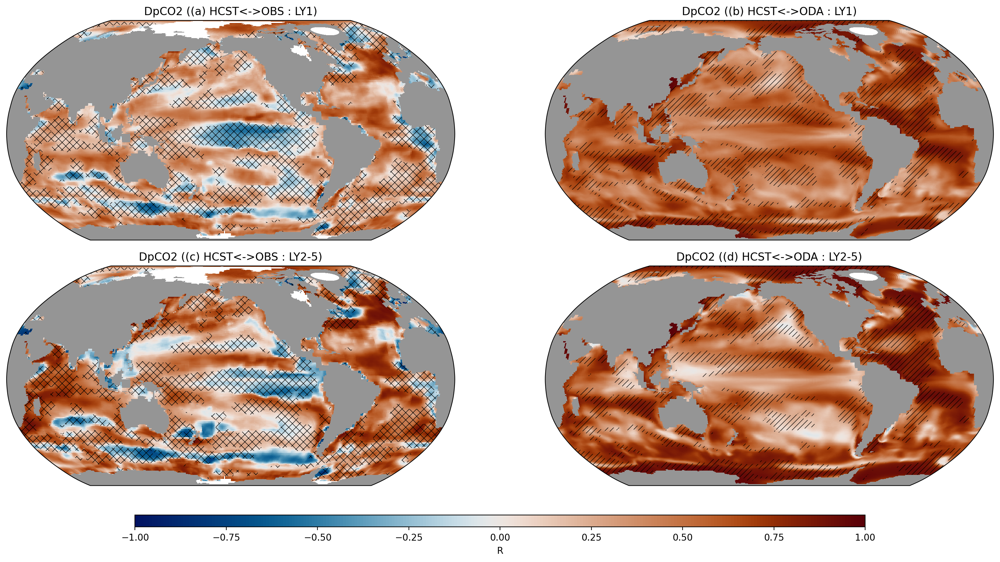

elasped time for plot: 96.48103356361389


In [22]:
# practice for panels (without box)

start_time = time.time()


varn=cfg_var.var #example

data_array=corr_HCST.median(dim='ens_HCST')
mask_land = np.isnan(data_array)  # 육지(NaN인 지역)
mask_land_numeric = mask_land.astype(int)
data_array = data_array.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
mask_land_sat = mask_land.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
    mask_land_numeric['TLONG']=ds_grid.TLONG
    mask_land_numeric['TLAT']=ds_grid.TLAT

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

projection = ccrs.Robinson(central_longitude=205)
cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(18.5, 9), 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=False)

# significant mask for ODA-LE corr > 0 
alpha = 0.10
t_stat_ODA, p_values_ODA = ttest_1samp(corr_ODA_diff, 0, axis=0)
ds_ODA = corr_ODA_diff.mean(dim='ens_ODA').where(p_values_ODA < alpha)
threshold = 0
mask_ODA = ds_ODA > threshold
mask_ODA_indices = np.where(mask_ODA)

# t_stat_HCST, p_values_HCST = ttest_1samp(corr_HCST, 0, axis=0)
# ds_HCST = corr_HCST.mean(dim='ens_HCST').where(p_values_HCST < alpha)
# threshold = 0
# mask_HCST = ds_HCST > threshold 

# grid_spacing_HCST = 10
# mask_HCST_land = mask_HCST & ~mask_land  # mask_ODA가 False이면서 육지가 아닌 지역
# HCST_valid_indices = np.where(mask_HCST_land)
# HCST_coarse_valid_indices = (HCST_valid_indices[0][::grid_spacing_HCST], HCST_valid_indices[1][::grid_spacing_HCST])

HCST_data_array_masked = data_array.where(mask_ODA)

# 그리드 간격 설정 (예: 5씩 건너뛰기)
grid_spacing = 1
mask_not_ODA_land = ~mask_ODA & ~mask_land  # mask_ODA가 False이면서 육지가 아닌 지역
not_valid_indices = np.where(mask_not_ODA_land)
coarse_not_valid_indices = (not_valid_indices[0][::grid_spacing], not_valid_indices[1][::grid_spacing])


# axes[0,0]: plot for actual skill (LY1, all members)

plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                ax=axes[0, 0], transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
# sct1 = axes[0, 0].scatter(ds_grid.TLONG.values[mask_ODA_indices], ds_grid.TLAT.values[mask_ODA_indices], 
#                           color='black', marker='o', s=0.1, alpha=0.2, transform=ccrs.PlateCarree())
# hatch1 = axes[0, 0].scatter(ds_grid.TLONG.values[coarse_not_valid_indices], ds_grid.TLAT.values[coarse_not_valid_indices],
#                           color='black', marker='x', s=0.1, alpha=0.2, transform=ccrs.PlateCarree()) # works
hatch1 = pop_add_cyclic(data_array.where(~mask_ODA, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes[0, 0], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well

land1 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(ax = axes[0,0], x='TLONG', y='TLAT', 
                  transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

axes[0, 0].set_title(f'{varn} ((a) HCST<->OBS : LY1)')


# axes[0,1]:  plot for potential predictability (LY1, all members)
# data_array=pp_HCST.mean(dim='ens_HCST').mean(dim='ens_ODA')
data_array = pp_HCST.stack(ens_combined=('ens_HCST', 'ens_ODA')).median(dim='ens_combined')
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
    
plt2=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                    ax=axes[0, 1], transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
# hatch2 = axes[0, 1].scatter(ds_grid.TLONG.values[HCST_coarse_valid_indices], ds_grid.TLAT.values[HCST_coarse_valid_indices],
#                           color='black', marker='o', s=5, alpha=0.1, transform=ccrs.PlateCarree())
# contour2 = axes[0,1].contour(data_array.TLONG, data_array.TLAT, HCST_data_array_masked, levels=[0], colors='black', transform=ccrs.PlateCarree())  # doesn't work
# contour2 = pop_add_cyclic(HCST_data_array_masked).plot.contourf(x='TLONG', y='TLAT', 
#                     ax=axes[0, 1], transform=ccrs.PlateCarree(), levels=[0,1], colors = 'none', hatches=['/']) # works but weird
# contour2 = pop_add_cyclic(HCST_data_array_masked.where(HCST_data_array_masked > 0, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
#                     ax=axes[0, 1], transform=ccrs.PlateCarree(), levels=[0,1], colors = 'black', alpha=0.2, add_colorbar=False) # works well
contour2 = pop_add_cyclic(HCST_data_array_masked.where(HCST_data_array_masked > 0, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes[0, 1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well
# contour2 = pop_add_cyclic(HCST_data_array_masked.where(HCST_data_array_masked > 0, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
#                     ax=axes[0, 1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['o'], add_colorbar=False) # works

land2 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(
    ax = axes[0,1], x='TLONG', y='TLAT', transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

# 3*3 interpolate and plot
# # Step 1: 1D로 펼친 경도, 위도, 데이터 값 추출
# points = np.array([ds_grid.TLONG.values.ravel(), ds_grid.TLAT.values.ravel()]).T
# values = HCST_data_array_masked.values.ravel()
# # Step 2: 3도 해상도의 격자 생성 (목표 경도와 위도)
# lon_new = np.arange(-180, 180.1, 3)  # 3도 간격의 경도
# lat_new = np.arange(-90, 90.1, 3)    # 3도 간격의 위도
# lon_grid, lat_grid = np.meshgrid(lon_new, lat_new)
# # Step 3: SciPy의 griddata를 사용하여 보간 수행
# data_interp = griddata(points, values, (lon_grid, lat_grid), method='linear')
# # Step 4: 새로운 격자에 맞는 xarray.DataArray 생성
# data_interp_da = xr.DataArray(data_interp, coords=[lat_new, lon_new], dims=["lat", "lon"])
# contour2 = axes[0,1].contourf(lon_grid, lat_grid, data_interp_da, levels=[0,1], colors='black', transform=ccrs.PlateCarree())


axes[0, 1].set_title(f'{varn} ((b) HCST<->ODA : LY1)')


# axes[1,0]:  plot for actual skill (LY2-5, all members)
data_array=corr_HCST_ly2_5.median(dim='ens_HCST')
data_array = data_array.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT

# t_stat_HCST, p_values_HCST = ttest_1samp(corr_HCST_ly2_5, 0, axis=0)
# ds_HCST = corr_HCST_ly2_5.mean(dim='ens_HCST').where(p_values_HCST < alpha)
# threshold = 0
# mask_HCST = ds_HCST > threshold 

# mask_HCST_land = mask_HCST & ~mask_land  # mask_ODA가 False이면서 육지가 아닌 지역
# HCST_valid_indices = np.where(mask_HCST_land)
# HCST_coarse_valid_indices = (HCST_valid_indices[0][::grid_spacing_HCST], HCST_valid_indices[1][::grid_spacing_HCST])

HCST_data_array_masked = data_array.where(mask_ODA)

plt3=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                    ax=axes[1, 0], transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
# sct3 = axes[1, 0].scatter(ds_grid.TLONG.values[mask_ODA_indices], ds_grid.TLAT.values[mask_ODA_indices], 
#                           color='black', marker='o', s=0.1, alpha=0.2, transform=ccrs.PlateCarree())
# hatch3 = axes[1, 0].scatter(ds_grid.TLONG.values[coarse_not_valid_indices], ds_grid.TLAT.values[coarse_not_valid_indices],
#                           color='black', marker='x', s=0.1, alpha=0.2, transform=ccrs.PlateCarree())
hatch3 = pop_add_cyclic(data_array.where(~mask_ODA, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes[1, 0], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well
land3 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(
    ax = axes[1,0], x='TLONG', y='TLAT', transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

axes[1, 0].set_title(f'{varn} ((c) HCST<->OBS : LY2-5)')


# axes[1,1]:  plot for actual skill (LY2-5, all members)
# data_array=pp_HCST_ly2_5.mean(dim='ens_HCST').mean(dim='ens_ODA')
data_array = pp_HCST_ly2_5.stack(ens_combined=('ens_HCST', 'ens_ODA')).median(dim='ens_combined')
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
    
plt4=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                    ax=axes[1, 1], transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
# hatch4 = axes[1, 1].scatter(ds_grid.TLONG.values[HCST_coarse_valid_indices], ds_grid.TLAT.values[HCST_coarse_valid_indices],
#                           color='black', marker='o', s=5, alpha=0.1, transform=ccrs.PlateCarree())
contour4 = pop_add_cyclic(HCST_data_array_masked.where(HCST_data_array_masked > 0, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes[1, 1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well
land4 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(
    ax = axes[1,1], x='TLONG', y='TLAT', transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)


axes[1, 1].set_title(f'{varn} ((d) HCST<->ODA : LY2-5)')

# plot for (WND ODA mask)

# (a), (b), (c) 서브플롯에 대해 위쪽에 큰 컬러바 추가
cbar_a_c = fig.add_axes([0.2, 0.05, 0.6, 0.02])  # [left, bottom, width, height] 비율로 컬러바 위치와 크기 설정
cbar1 = fig.colorbar(plt1, cax=cbar_a_c, orientation='horizontal')
cbar1.set_label('R')

plt.rcParams.update({'font.size': 12})
plt.rcParams['hatch.linewidth'] = 0.5  # 기본값은 1.0, hatch linewidth 조절

# 전체 레이아웃 조정
plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.95])  # 상단과 하단의 레이아웃 여백을 맞추기 위해 rect 설정 [left bottom right top]
# plt.tight_layout()

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))

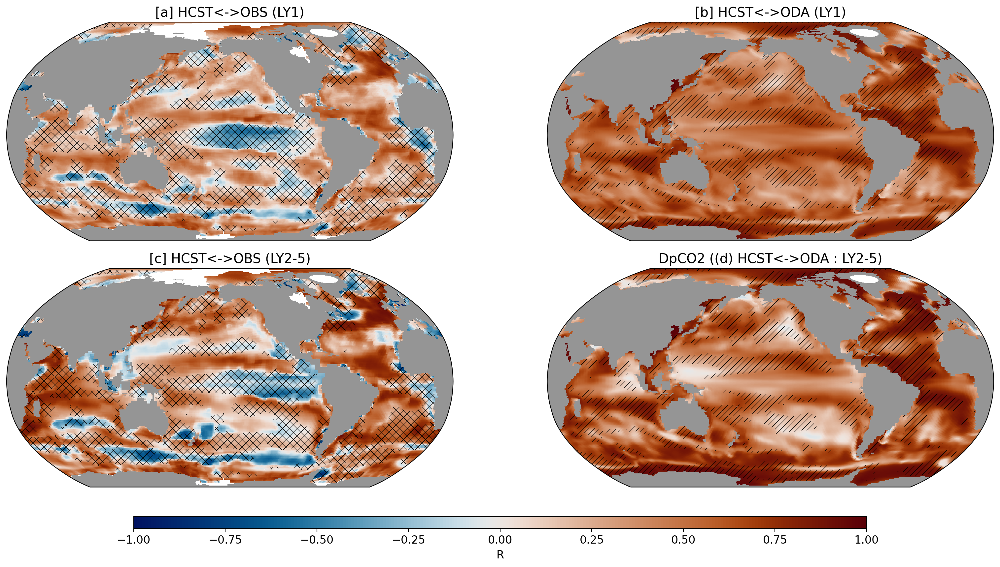

elasped time for plot: 87.17831206321716


In [23]:
# practice for panels (with boxes)

start_time = time.time()

varn=cfg_var.var #example

data_array=corr_HCST.median(dim='ens_HCST')
mask_land = np.isnan(data_array)  # 육지(NaN인 지역)
mask_land_numeric = mask_land.astype(int)
data_array = data_array.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
mask_land_sat = mask_land.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
    mask_land_numeric['TLONG']=ds_grid.TLONG
    mask_land_numeric['TLAT']=ds_grid.TLAT

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

projection = ccrs.Robinson(central_longitude=205)
cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(18.5, 9), 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=False)

# significant mask for ODA-LE corr > 0 
alpha = 0.10
t_stat_ODA, p_values_ODA = ttest_1samp(corr_ODA_diff, 0, axis=0)
ds_ODA = corr_ODA_diff.mean(dim='ens_ODA').where(p_values_ODA < alpha)
threshold = 0
mask_ODA = ds_ODA > threshold
mask_ODA_indices = np.where(mask_ODA)

HCST_data_array_masked = data_array.where(mask_ODA)

# 그리드 간격 설정 (예: 5씩 건너뛰기)
grid_spacing = 1
mask_not_ODA_land = ~mask_ODA & ~mask_land  # mask_ODA가 False이면서 육지가 아닌 지역
not_valid_indices = np.where(mask_not_ODA_land)
coarse_not_valid_indices = (not_valid_indices[0][::grid_spacing], not_valid_indices[1][::grid_spacing])


# axes[0,0]: plot for actual skill (LY1, all members)

plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                ax=axes[0, 0], transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
hatch1 = pop_add_cyclic(data_array.where(~mask_ODA, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes[0, 0], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well

land1 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(ax = axes[0,0], x='TLONG', y='TLAT', 
                  transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

axes[0, 0].set_title('[a] HCST<->OBS (LY1)')


data_array=pp_HCST.mean(dim='ens_HCST').mean(dim='ens_ODA')
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
    
plt2=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                    ax=axes[0, 1], transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
contour2 = pop_add_cyclic(HCST_data_array_masked.where(HCST_data_array_masked > 0, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes[0, 1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well
land2 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(
    ax = axes[0,1], x='TLONG', y='TLAT', transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

axes[0, 1].set_title('[b] HCST<->ODA (LY1)')


# axes[1,0]:  plot for actual skill (LY2-5, all members)
data_array=corr_HCST_ly2_5.mean(dim='ens_HCST')
data_array = data_array.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT


HCST_data_array_masked = data_array.where(mask_ODA)

plt3=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                    ax=axes[1, 0], transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
hatch3 = pop_add_cyclic(data_array.where(~mask_ODA, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes[1, 0], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well
land3 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(
    ax = axes[1,0], x='TLONG', y='TLAT', transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

axes[1, 0].set_title('[c] HCST<->OBS (LY2-5)')


# axes[1,1]:  plot for actual skill (LY2-5, all members)
data_array=pp_HCST_ly2_5.mean(dim='ens_HCST').mean(dim='ens_ODA')
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
    
plt4=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                    ax=axes[1, 1], transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
contour4 = pop_add_cyclic(HCST_data_array_masked.where(HCST_data_array_masked > 0, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes[1, 1], transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['////'], add_colorbar=False) # works very well
land4 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(
    ax = axes[1,1], x='TLONG', y='TLAT', transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

axes[1, 1].set_title(f'{varn} ((d) HCST<->ODA : LY2-5)')

# plot for (WND ODA mask)

# (a), (b), (c) 서브플롯에 대해 위쪽에 큰 컬러바 추가
cbar_a_c = fig.add_axes([0.2, 0.05, 0.6, 0.02])  # [left, bottom, width, height] 비율로 컬러바 위치와 크기 설정
cbar1 = fig.colorbar(plt1, cax=cbar_a_c, orientation='horizontal')
cbar1.set_label('R')

plt.rcParams.update({'font.size': 12})
plt.rcParams['hatch.linewidth'] = 0.5  # 기본값은 1.0, hatch linewidth 조절

# 사각형 좌표 설정 (예: 중앙 태평양 영역)
rectangle_coords = [-150, 0]  # 중앙값 중심의 좌표 (경도, 위도)
rectangle_width = 20 # 경도 단위
rectangle_height = 20 # 위도 단위
# axes[0, 0]에 사각형 추가
rect = patches.Rectangle(rectangle_coords, rectangle_width, rectangle_height,
                         linewidth=0.5, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())



# 전체 레이아웃 조정
plt.tight_layout(rect=[0.05, 0.1, 0.95, 0.95])  # 상단과 하단의 레이아웃 여백을 맞추기 위해 rect 설정 [left bottom right top]

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))

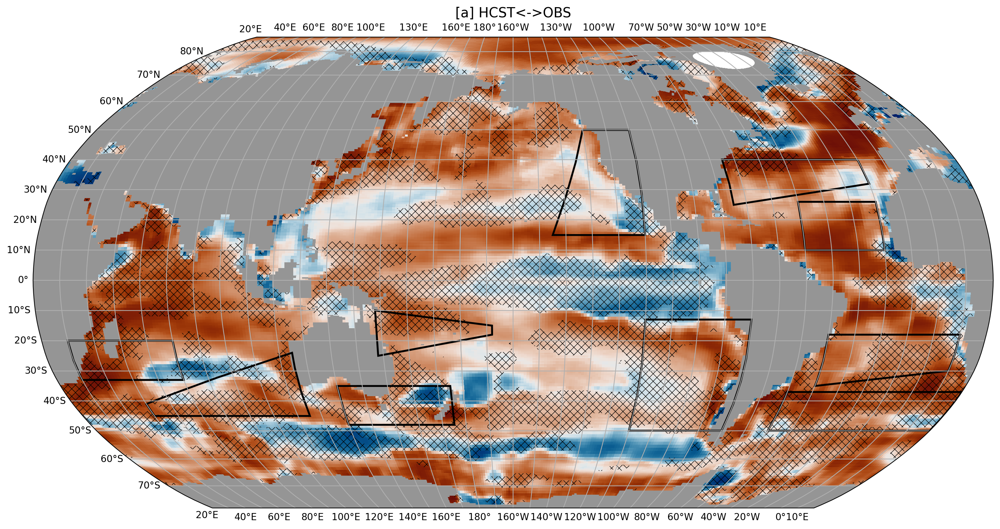

elasped time for plot: 18.717177867889404


In [24]:
# practice for panels (with boxes)

start_time = time.time()

varn=cfg_var.var #example

# data_array=corr_HCST.mean(dim='ens_HCST')
data_array=corr_HCST_ly2_5.median(dim='ens_HCST')

mask_land = np.isnan(data_array)  # 육지(NaN인 지역)
mask_land_numeric = mask_land.astype(int)
# data_array = data_array.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
# mask_land_sat = mask_land.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
    mask_land_numeric['TLONG']=ds_grid.TLONG
    mask_land_numeric['TLAT']=ds_grid.TLAT

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

projection = ccrs.Robinson(central_longitude=200)
cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(18.5, 9), 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=False)

# significant mask for ODA-LE corr > 0 
alpha = 0.10
t_stat_ODA, p_values_ODA = ttest_1samp(corr_ODA_diff, 0, axis=0)
ds_ODA = corr_ODA_diff.mean(dim='ens_ODA').where(p_values_ODA < alpha)
threshold = 0
mask_ODA = ds_ODA > threshold
mask_ODA_indices = np.where(mask_ODA)

HCST_data_array_masked = data_array.where(mask_ODA)

# 그리드 간격 설정 (예: 5씩 건너뛰기)
grid_spacing = 1
mask_not_ODA_land = ~mask_ODA & ~mask_land  # mask_ODA가 False이면서 육지가 아닌 지역
not_valid_indices = np.where(mask_not_ODA_land)
coarse_not_valid_indices = (not_valid_indices[0][::grid_spacing], not_valid_indices[1][::grid_spacing])

plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                ax=axes, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
hatch1 = pop_add_cyclic(data_array.where(~mask_ODA, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well

land1 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(ax = axes, x='TLONG', y='TLAT', 
                  transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

# axes.gridlines(draw_labels=True) 
# axes.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
# axes.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

# 경도, 위도 그리드라인 추가
gridlines = axes.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

# 10도 간격으로 그리드 설정
gridlines.xlocator = mticker.FixedLocator(np.arange(-180, 181, 10))  # 경도는 -180도에서 180도까지 10도 간격
gridlines.ylocator = mticker.FixedLocator(np.arange(-90, 91, 10))    # 위도는 -90도에서 90도까지 10도 간격

# 그리드 라벨 포맷 지정 (위도, 경도 포맷)
gridlines.xlabel_style = {'size': 10, 'color': 'black'}
gridlines.ylabel_style = {'size': 10, 'color': 'black'}

axes.set_title('[a] HCST<->OBS')


# 1. Madagascar
trapezoid_coords = [
    [30.0, -33],  # 왼쪽 아래
    [70, -33],  # 오른쪽 아래
    [70, -20],  # 오른쪽 위
    [30, -20]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#2. SEIO
trapezoid_coords = [
    [50, -45],  # 왼쪽 아래
    [115, -45],  # 오른쪽 아래
    [115, -24],  # 오른쪽 위
    [50, -41]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#3. Tasmania
trapezoid_coords = [
    [130, -48],  # 왼쪽 아래
    [175, -48],  # 오른쪽 아래
    [175, -35],  # 오른쪽 위
    [130, -35]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#4. SWSP
trapezoid_coords = [
    [148, -25],  # 왼쪽 아래
    [192, -18],  # 오른쪽 아래
    [192, -15],  # 오른쪽 위
    [148, -10]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#5. NEP
trapezoid_coords = [
    [215, 15],  # 왼쪽 아래
    [250, 15],  # 오른쪽 아래
    [250, 50],  # 오른쪽 위
    [230, 50]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#6. SEP
trapezoid_coords = [
    [250, -50],  # 왼쪽 아래
    [290, -50],  # 오른쪽 아래
    [290, -13],  # 오른쪽 위
    [250, -13]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#7. NWA
trapezoid_coords = [
    [-75, 25],  # 왼쪽 아래
    [-20, 32],  # 오른쪽 아래
    [-20, 40],  # 오른쪽 위
    [-75, 40]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#8. NEA
trapezoid_coords = [
    [-50, 10],  # 왼쪽 아래
    [-20, 10],  # 오른쪽 아래
    [-20, 26],  # 오른쪽 위
    [-50, 26]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#9. SA
trapezoid_coords = [
    [-40, -35],  # 왼쪽 아래
    [10, -30],  # 오른쪽 아래
    [10, -18],  # 오른쪽 위
    [-40, -18]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)


#10. SO
trapezoid_coords = [
    [-50, -50],  # 왼쪽 아래
    [20, -50],  # 오른쪽 아래
    [20, -37],  # 오른쪽 위
    [-50, -37]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))

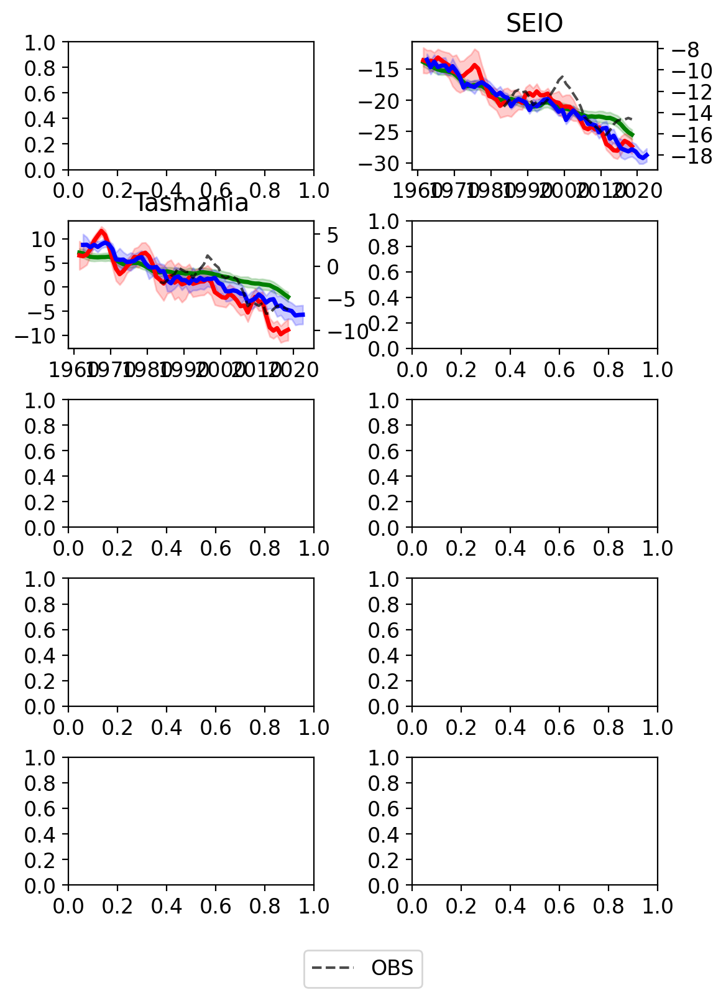

elasped time for plot: 638.6044487953186


In [25]:
start_time = time.time()

varn=cfg_var.var #example

data_array=corr_HCST_ly2_5.mean(dim='ens_HCST')
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

# significant mask for ODA-LE corr > 0 
alpha = 0.10
t_stat_ODA, p_values_ODA = ttest_1samp(corr_ODA_diff, 0, axis=0)
ds_ODA = corr_ODA_diff.mean(dim='ens_ODA').where(p_values_ODA < alpha)
threshold = 0
mask_ODA = ds_ODA > threshold

data_array_masked = data_array.where(mask_ODA)

# obs_annual_mean
# oda_full_annual_mean
# le_full_annual_mean
# hcst_ly1_annual_mean

obs_rolling_mean_masked = obs_rolling_mean.where(mask_ODA).compute()
oda_full_rolling_mean_masked = oda_full_rolling_mean.where(mask_ODA).compute()
ada_full_rolling_mean_masked = ada_full_rolling_mean.where(mask_ODA).compute()
le_full_rolling_mean_masked = le_full_rolling_mean.where(mask_ODA).compute()
hcst_full_ly2_5_annual_mean_masked = hcst_full_ly2_5_annual_mean.where(mask_ODA).compute()

# time series figure, axis set
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(6, 6*1.414), dpi=200, constrained_layout=False)

# # 1. Madagascar
# trapezoid_coords = [
#     [30.0, -33],  # 왼쪽 아래
#     [70, -33],  # 오른쪽 아래
#     [70, -20],  # 오른쪽 위
#     [30, -20]  # 왼쪽 위
# ]
# # Polygon 형태로 사다리꼴 영역 생성
# trapezoid_path = mpath.Path(trapezoid_coords)
# # OBS 데이터의 경도와 위도 좌표
# lons = cfg_var.OBS_ds.TLONG.values  # 경도
# lats = cfg_var.OBS_ds.TLAT.values   # 위도
# # 경도와 위도 좌표를 2D 배열로 변환
# points = np.vstack((lons.ravel(), lats.ravel())).T  # (nlat*nlon, 2)
# # 사다리꼴 내부에 있는 점들 필터링
# inside_trapezoid = trapezoid_path.contains_points(points).reshape(lons.shape)
# # mask로 해당 영역 필터링
# le_masked_region = le_full_rolling_mean_masked.where(inside_trapezoid)
# oda_masked_region = oda_full_rolling_mean_masked.where(inside_trapezoid)
# hcst_masked_region = hcst_full_ly2_5_annual_mean_masked.where(inside_trapezoid)
# obs_masked_region = obs_rolling_mean_masked.where(inside_trapezoid)

# # 필터링된 점들에 대해 time series 생성 (NaN 값 제외)
# weights = np.cos(np.deg2rad(obs_masked_region['TLAT']))  # TLAT은 위도 값

# le_time_series_data = le_masked_region.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
# le_ensemble_mean = le_time_series_data.mean(dim='ens_LE')
# le_ensemble_std = le_time_series_data.std(dim='ens_LE')

# oda_time_series_data = oda_masked_region.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
# oda_ensemble_mean = oda_time_series_data.mean(dim='ens_ODA')
# oda_ensemble_std = oda_time_series_data.std(dim='ens_ODA')

# hcst_time_series_data = hcst_masked_region.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
# hcst_ensemble_mean = hcst_time_series_data.mean(dim='ens_HCST')
# hcst_ensemble_std = hcst_time_series_data.std(dim='ens_HCST')

# obs_time_series_data = obs_masked_region.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()

# #LE
# ax[0,0].fill_between(le_time_series_data.year.values, 
#                  le_ensemble_mean[cfg_var.var].values - le_ensemble_std[cfg_var.var].values, 
#                  le_ensemble_mean[cfg_var.var].values + le_ensemble_std[cfg_var.var].values, 
#                  color='green', alpha=0.2)
# ax[0,0].plot(le_time_series_data.year.values, le_ensemble_mean[cfg_var.var].values, color='green', linewidth=2.5, label='LE Ensemble Mean')

# #ODA
# ax[0,0].fill_between(oda_time_series_data.year.values, 
#                  oda_ensemble_mean[cfg_var.var].values - oda_ensemble_std[cfg_var.var].values, 
#                  oda_ensemble_mean[cfg_var.var].values + oda_ensemble_std[cfg_var.var].values, 
#                  color='red', alpha=0.2)
# ax[0,0].plot(oda_time_series_data.year.values, oda_ensemble_mean[cfg_var.var].values, color='red', linewidth=2.5, label='ODA Ensemble Mean')

# #HCST
# # shading area로 spread (ensemble mean ± 1 standard deviation)
# ax[0,0].fill_between(hcst_time_series_data.year.values, 
#                  hcst_ensemble_mean.values - hcst_ensemble_std.values, 
#                  hcst_ensemble_mean.values + hcst_ensemble_std.values, 
#                  color='blue', alpha=0.2)
# # ensemble mean plot (굵은 파란색 선)
# ax[0,0].plot(hcst_time_series_data.year.values, hcst_ensemble_mean.values, color='blue', linewidth=2.5, label='HCST Ensemble Mean')
# ax[0,0].set_title('Madagascar', loc='center')

# # ax[0,0].set_xlabel('Year')
# # ax[0,0].set_ylabel('MODELS')

# #OBS
# ax2 = ax[0,0].twinx()
# ax2.plot(obs_time_series_data.year.values, obs_time_series_data[cfg_var.var].values, 
#          color='black', alpha=0.7, linewidth=1.5, label='OBS', linestyle='--')
# # ax2.bar(obs_time_series_data.year.values, obs_time_series_data[cfg_var.var].values, 
# #         color='black', alpha=0.7, label='OBS', width=1.0)
# # ax2.set_ylabel('OBS')
# ymin, ymax = ax2.get_ylim()
# ax2.set_ylim(ymin - (ymax-ymin)/2, ymax + (ymax-ymin)/2)


# #2. SEIO
# trapezoid_coords = [
#     [50, -45],  # 왼쪽 아래
#     [115, -45],  # 오른쪽 아래
#     [115, -24],  # 오른쪽 위
#     [50, -41]  # 왼쪽 위
# ]
#7. NWA
# trapezoid_coords = [
#     [-75, 25],  # 왼쪽 아래
#     [-20, 32],  # 오른쪽 아래
#     [-20, 40],  # 오른쪽 위
#     [-75, 40]  # 왼쪽 위
# ]
trapezoid_coords = [
    [285, 25],  # 왼쪽 아래
    [340, 32],  # 오른쪽 아래
    [340, 40],  # 오른쪽 위
    [285, 40]  # 왼쪽 위
]
trapezoid_path = mpath.Path(trapezoid_coords)
lons = cfg_var.OBS_ds.TLONG.values  # 경도
lats = cfg_var.OBS_ds.TLAT.values   # 위도
points = np.vstack((lons.ravel(), lats.ravel())).T  # (nlat*nlon, 2)
inside_trapezoid = trapezoid_path.contains_points(points).reshape(lons.shape)
le_masked_region = le_full_rolling_mean_masked.where(inside_trapezoid)
oda_masked_region = oda_full_rolling_mean_masked.where(inside_trapezoid)
hcst_masked_region = hcst_full_ly2_5_annual_mean_masked.where(inside_trapezoid)
obs_masked_region = obs_rolling_mean_masked.where(inside_trapezoid)
weights = np.cos(np.deg2rad(obs_masked_region['TLAT']))  # TLAT은 위도 값
le_time_series_data = le_masked_region.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
le_ensemble_mean = le_time_series_data.mean(dim='ens_LE')
le_ensemble_std = le_time_series_data.std(dim='ens_LE')
oda_time_series_data = oda_masked_region.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
oda_ensemble_mean = oda_time_series_data.mean(dim='ens_ODA')
oda_ensemble_std = oda_time_series_data.std(dim='ens_ODA')
hcst_time_series_data = hcst_masked_region.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
hcst_ensemble_mean = hcst_time_series_data.mean(dim='ens_HCST')
hcst_ensemble_std = hcst_time_series_data.std(dim='ens_HCST')
obs_time_series_data = obs_masked_region.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
ax[0,1].fill_between(le_time_series_data.year.values, 
                 le_ensemble_mean[cfg_var.var].values - le_ensemble_std[cfg_var.var].values, 
                 le_ensemble_mean[cfg_var.var].values + le_ensemble_std[cfg_var.var].values, 
                 color='green', alpha=0.2)
ax[0,1].plot(le_time_series_data.year.values, le_ensemble_mean[cfg_var.var].values, color='green', linewidth=2.5, label='LE Ensemble Mean')
ax[0,1].fill_between(oda_time_series_data.year.values, 
                 oda_ensemble_mean[cfg_var.var].values - oda_ensemble_std[cfg_var.var].values, 
                 oda_ensemble_mean[cfg_var.var].values + oda_ensemble_std[cfg_var.var].values, 
                 color='red', alpha=0.2)
ax[0,1].plot(oda_time_series_data.year.values, oda_ensemble_mean[cfg_var.var].values, color='red', linewidth=2.5, label='ODA Ensemble Mean')
ax[0,1].fill_between(hcst_time_series_data.year.values, 
                 hcst_ensemble_mean.values - hcst_ensemble_std.values, 
                 hcst_ensemble_mean.values + hcst_ensemble_std.values, 
                 color='blue', alpha=0.2)
ax[0,1].plot(hcst_time_series_data.year.values, hcst_ensemble_mean.values, color='blue', linewidth=2.5, label='HCST Ensemble Mean')
ax[0,1].set_title('SEIO', loc='center')
ax2 = ax[0,1].twinx()
ax2.plot(obs_time_series_data.year.values, obs_time_series_data[cfg_var.var].values, 
         color='black', alpha=0.7, linewidth=1.5, label='OBS', linestyle='--')
ymin, ymax = ax2.get_ylim()
ax2.set_ylim(ymin - (ymax-ymin)/2, ymax + (ymax-ymin)/2)

# #3. Tasmania
# trapezoid_coords = [
#     [130, -48],  # 왼쪽 아래
#     [175, -48],  # 오른쪽 아래
#     [175, -35],  # 오른쪽 위
#     [130, -35]  # 왼쪽 위
# ]

#8. NEA
trapezoid_coords = [
    [310, 10],  # 왼쪽 아래
    [340, 10],  # 오른쪽 아래
    [340, 26],  # 오른쪽 위
    [310, 26]  # 왼쪽 위
]
trapezoid_path = mpath.Path(trapezoid_coords)
lons = cfg_var.OBS_ds.TLONG.values  # 경도
lats = cfg_var.OBS_ds.TLAT.values   # 위도
points = np.vstack((lons.ravel(), lats.ravel())).T  # (nlat*nlon, 2)
inside_trapezoid = trapezoid_path.contains_points(points).reshape(lons.shape)
le_masked_region = le_full_rolling_mean_masked.where(inside_trapezoid)
oda_masked_region = oda_full_rolling_mean_masked.where(inside_trapezoid)
hcst_masked_region = hcst_full_ly2_5_annual_mean_masked.where(inside_trapezoid)
obs_masked_region = obs_rolling_mean_masked.where(inside_trapezoid)
weights = np.cos(np.deg2rad(obs_masked_region['TLAT']))  # TLAT은 위도 값
le_time_series_data = le_masked_region.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
le_ensemble_mean = le_time_series_data.mean(dim='ens_LE')
le_ensemble_std = le_time_series_data.std(dim='ens_LE')
oda_time_series_data = oda_masked_region.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
oda_ensemble_mean = oda_time_series_data.mean(dim='ens_ODA')
oda_ensemble_std = oda_time_series_data.std(dim='ens_ODA')
hcst_time_series_data = hcst_masked_region.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
hcst_ensemble_mean = hcst_time_series_data.mean(dim='ens_HCST')
hcst_ensemble_std = hcst_time_series_data.std(dim='ens_HCST')
obs_time_series_data = obs_masked_region.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
ax[1,0].fill_between(le_time_series_data.year.values, 
                 le_ensemble_mean[cfg_var.var].values - le_ensemble_std[cfg_var.var].values, 
                 le_ensemble_mean[cfg_var.var].values + le_ensemble_std[cfg_var.var].values, 
                 color='green', alpha=0.2)
ax[1,0].plot(le_time_series_data.year.values, le_ensemble_mean[cfg_var.var].values, color='green', linewidth=2.5, label='LE Ensemble Mean')
ax[1,0].fill_between(oda_time_series_data.year.values, 
                 oda_ensemble_mean[cfg_var.var].values - oda_ensemble_std[cfg_var.var].values, 
                 oda_ensemble_mean[cfg_var.var].values + oda_ensemble_std[cfg_var.var].values, 
                 color='red', alpha=0.2)
ax[1,0].plot(oda_time_series_data.year.values, oda_ensemble_mean[cfg_var.var].values, color='red', linewidth=2.5, label='ODA Ensemble Mean')
ax[1,0].fill_between(hcst_time_series_data.year.values, 
                 hcst_ensemble_mean.values - hcst_ensemble_std.values, 
                 hcst_ensemble_mean.values + hcst_ensemble_std.values, 
                 color='blue', alpha=0.2)
ax[1,0].plot(hcst_time_series_data.year.values, hcst_ensemble_mean.values, color='blue', linewidth=2.5, label='HCST Ensemble Mean')
ax[1,0].set_title('Tasmania', loc='center')
ax2 = ax[1,0].twinx()
ax2.plot(obs_time_series_data.year.values, obs_time_series_data[cfg_var.var].values, 
         color='black', alpha=0.7, linewidth=1.5, label='OBS', linestyle='--')
ymin, ymax = ax2.get_ylim()
ax2.set_ylim(ymin - (ymax-ymin)/2, ymax + (ymax-ymin)/2)




# tick labels 제거
# for axe in ax.flat:  # 모든 subplot에 대해 반복
#     axe.set_xticklabels([])  # x축 tick labels 제거
# for axe in ax.flat:
#     axe.set_yticklabels([])  # y축 tick labels 제거

# lines_ax, labels_ax = ax.get_legend_handles_labels()  # ax에서 line과 label 가져오기
# lines_ax2, labels_ax2 = ax2.get_legend_handles_labels()  # ax2에서 line과 label 가져오기
# ax.legend(lines_ax + lines_ax2, labels_ax + labels_ax2, loc='upper right')  # 합쳐서 표시

# 바깥에 큰 legend 만들기
# handles, labels = [], []
# for axe in ax.flat:
#     h, l = axe.get_legend_handles_labels()
#     handles.extend(h)
#     labels.extend(l)

# fig.legend로 전체 figure 바깥에 배치
lines_ax, labels_ax = ax[0,0].get_legend_handles_labels()  # ax에서 line과 label 가져오기
lines_ax2, labels_ax2 = ax2.get_legend_handles_labels()  # ax2에서 line과 label 가져오기
fig.legend(lines_ax + lines_ax2, labels_ax + labels_ax2, loc='upper center', bbox_to_anchor=(0.5, 0), ncol=2)  # 아래쪽 바깥에 배치
plt.tight_layout(rect=[0, 0, 1, 0.9])  # subplot들이 차지하는 영역 조정
plt.subplots_adjust(hspace=0.4, wspace=0.4)

plt.rcParams.update({'font.size': 6})

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))

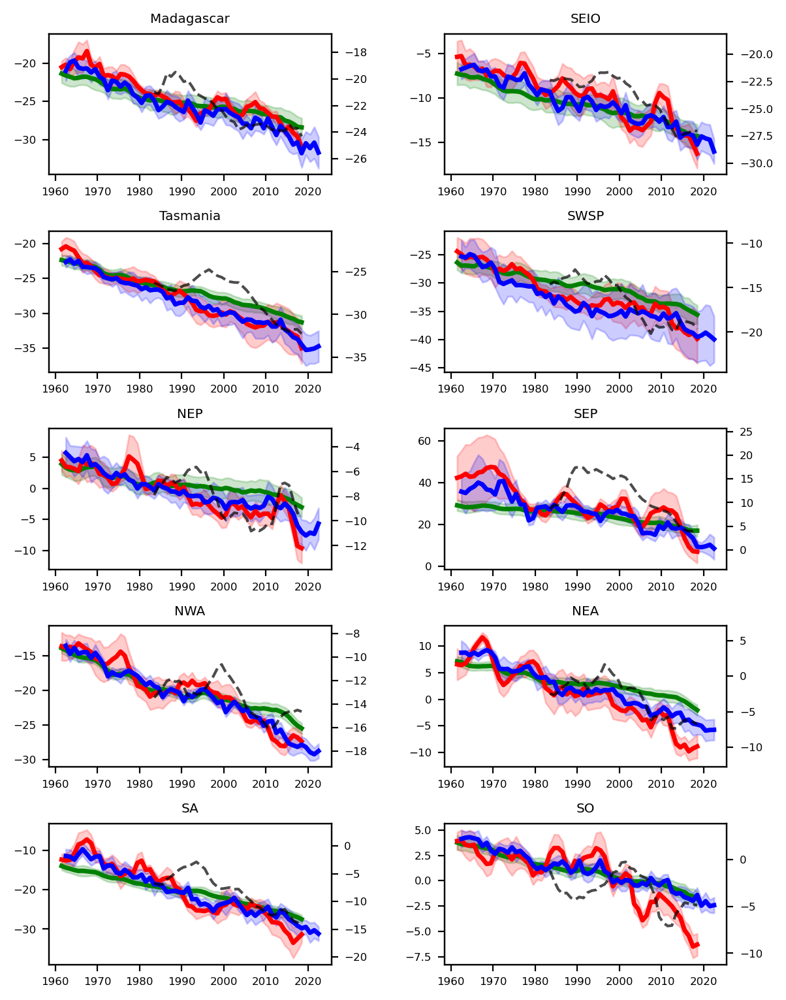

In [26]:
def create_trapezoid_path(coords):
    """사다리꼴 좌표를 받아 경로 생성"""
    return mpath.Path(coords)

def filter_region_by_trapezoid(coords, lons, lats, data):
    """사다리꼴 경로 내부에 있는 점들을 필터링"""
    trapezoid_path = create_trapezoid_path(coords)
    points = np.vstack((lons.ravel(), lats.ravel())).T
    inside_trapezoid = trapezoid_path.contains_points(points).reshape(lons.shape)
    return data.where(inside_trapezoid)

def plot_time_series(ax, ax2, le_time_series_data, oda_time_series_data, hcst_time_series_data, obs_time_series_data, cfg_var):
    """한 subplot에 대한 time series 및 fill_between 플롯 생성"""
    # LE
    ax.fill_between(le_time_series_data.year.values, 
                    le_time_series_data.mean(dim='ens_LE')[cfg_var.var].values - le_time_series_data.std(dim='ens_LE')[cfg_var.var].values,
                    le_time_series_data.mean(dim='ens_LE')[cfg_var.var].values + le_time_series_data.std(dim='ens_LE')[cfg_var.var].values,
                    color='green', alpha=0.2)
    ax.plot(le_time_series_data.year.values, le_time_series_data.mean(dim='ens_LE')[cfg_var.var].values, color='green', linewidth=2.5)
    
    # ODA
    ax.fill_between(oda_time_series_data.year.values, 
                    oda_time_series_data.mean(dim='ens_ODA')[cfg_var.var].values - oda_time_series_data.std(dim='ens_ODA')[cfg_var.var].values,
                    oda_time_series_data.mean(dim='ens_ODA')[cfg_var.var].values + oda_time_series_data.std(dim='ens_ODA')[cfg_var.var].values,
                    color='red', alpha=0.2)
    ax.plot(oda_time_series_data.year.values, oda_time_series_data.mean(dim='ens_ODA')[cfg_var.var].values, color='red', linewidth=2.5)

    # HCST
    ax.fill_between(hcst_time_series_data.year.values, 
                    hcst_time_series_data.mean(dim='ens_HCST').values - hcst_time_series_data.std(dim='ens_HCST').values,
                    hcst_time_series_data.mean(dim='ens_HCST').values + hcst_time_series_data.std(dim='ens_HCST').values,
                    color='blue', alpha=0.2)
    ax.plot(hcst_time_series_data.year.values, hcst_time_series_data.mean(dim='ens_HCST').values, color='blue', linewidth=2.5)

    # OBS
    ax2.plot(obs_time_series_data.year.values, obs_time_series_data[cfg_var.var].values, 
             color='black', alpha=0.7, linewidth=1.5, linestyle='--')
    
    # y축 범위 조정
    ymin, ymax = ax2.get_ylim()
    ax2.set_ylim(ymin - (ymax - ymin) / 2, ymax + (ymax - ymin) / 2)

def process_region(ax, ax2, coords, lons, lats, cfg_var, le_data, oda_data, hcst_data, obs_data):
    """영역을 필터링하고 플로팅"""
    le_filtered = filter_region_by_trapezoid(coords, lons, lats, le_data)
    oda_filtered = filter_region_by_trapezoid(coords, lons, lats, oda_data)
    hcst_filtered = filter_region_by_trapezoid(coords, lons, lats, hcst_data)
    obs_filtered = filter_region_by_trapezoid(coords, lons, lats, obs_data)

    # 위도에 따른 가중치 적용 후 평균 계산
    weights = np.cos(np.deg2rad(obs_filtered['TLAT']))
    le_time_series_data = le_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
    oda_time_series_data = oda_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
    hcst_time_series_data = hcst_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
    obs_time_series_data = obs_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()

    plot_time_series(ax, ax2, le_time_series_data, oda_time_series_data, hcst_time_series_data, obs_time_series_data, cfg_var)

# 좌표 설정 (사전으로 관리)
regions = {
    "Madagascar": [[30.0, -33], [70, -33], [70, -20], [30, -20]],
    "SEIO": [[50, -45], [115, -45], [115, -24], [50, -41]],
    "Tasmania": [[130, -48], [175, -48], [175, -35], [130, -35]],
    "SWSP": [[148, -25], [192, -18], [192, -15], [148, -10]],
    "NEP": [[215, 15], [250, 15], [250, 50], [230, 50]],
    "SEP": [[250, -50], [290, -50], [290, -13], [250, -13]],
    "NWA": [[285, 25], [340, 32], [340, 40], [285, 40]],
    "NEA": [[310, 10], [340, 10], [340, 26], [310, 26]],
    "SA": [[-40, -35], [10, -30], [10, -18], [-40, -18]],
    "SO": [[-50, -50], [20, -50], [20, -37], [-50, -37]],
}

# 그림 생성
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(6, 6*1.414), dpi=200, constrained_layout=False)
lons = cfg_var.OBS_ds.TLONG.values
lats = cfg_var.OBS_ds.TLAT.values

# 영역에 대해 반복 처리
for idx, (region_name, coords) in enumerate(regions.items()):
    i, j = divmod(idx, 2)
    ax2 = ax[i, j].twinx()  # 새로운 축 생성
    process_region(ax[i, j], ax2, coords, lons, lats, cfg_var, le_full_rolling_mean_masked, oda_full_rolling_mean_masked, hcst_full_ly2_5_annual_mean_masked, obs_rolling_mean_masked)
    ax[i, j].set_title(region_name)

# Legend
# lines_ax, labels_ax = ax[0,0].get_legend_handles_labels()  # ax에서 line과 label 가져오기
# lines_ax2, labels_ax2 = ax2.get_legend_handles_labels()  # ax2에서 line과 label 가져오기
# fig.legend(lines_ax + lines_ax2, labels_ax + labels_ax2, loc='upper center', bbox_to_anchor=(0.5, 0), ncol=2)  # 아래쪽 바깥에 배치

# 전체 플롯 관련 설정
plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.subplots_adjust(hspace=0.4, wspace=0.4) # vertical, horizontal

plt.show()

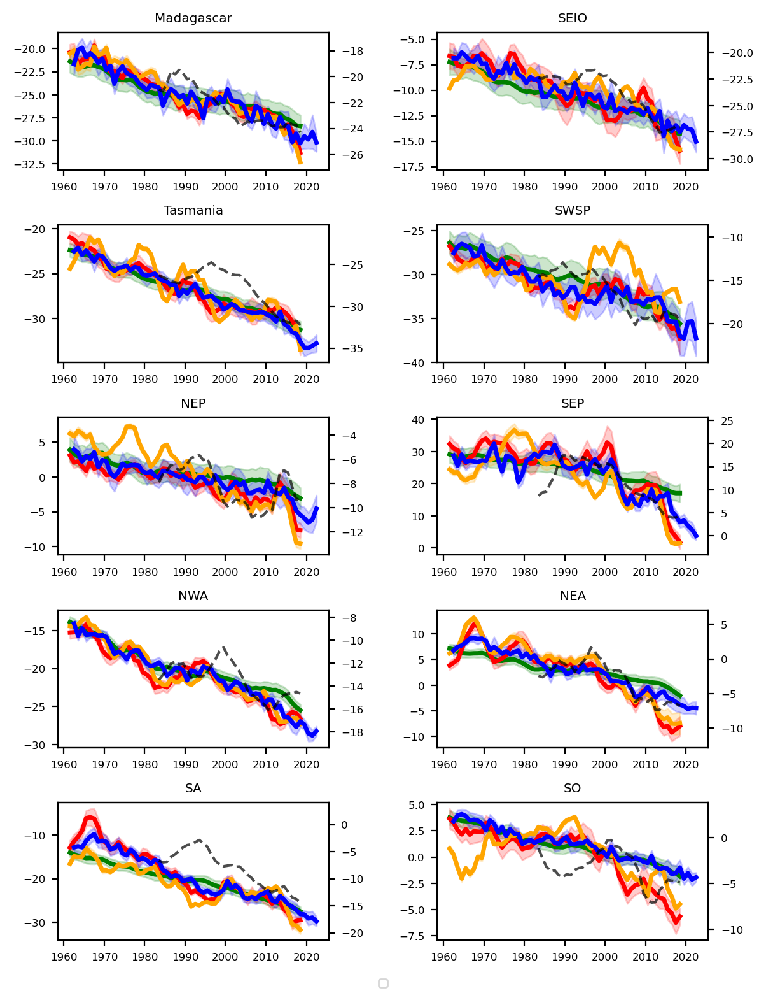

In [27]:
def create_trapezoid_path(coords):
    """사다리꼴 좌표를 받아 경로 생성"""
    return mpath.Path(coords)

def filter_region_by_trapezoid(coords, lons, lats, data):
    """사다리꼴 경로 내부에 있는 점들을 필터링"""
    trapezoid_path = create_trapezoid_path(coords)
    points = np.vstack((lons.ravel(), lats.ravel())).T
    inside_trapezoid = trapezoid_path.contains_points(points).reshape(lons.shape)
    return data.where(inside_trapezoid)

def plot_time_series(ax, ax2, le_time_series_data, oda_time_series_data, ada_time_series_data, hcst_time_series_data, obs_time_series_data, cfg_var):
    """한 subplot에 대한 time series 및 fill_between 플롯 생성"""
    # LE
    ax.fill_between(le_time_series_data.year.values, 
                    le_time_series_data.mean(dim='ens_LE')[cfg_var.var].values - le_time_series_data.std(dim='ens_LE')[cfg_var.var].values,
                    le_time_series_data.mean(dim='ens_LE')[cfg_var.var].values + le_time_series_data.std(dim='ens_LE')[cfg_var.var].values,
                    color='green', alpha=0.2)
    ax.plot(le_time_series_data.year.values, le_time_series_data.mean(dim='ens_LE')[cfg_var.var].values, color='green', linewidth=2.5)
    
    # ODA
    ax.fill_between(oda_time_series_data.year.values, 
                    oda_time_series_data.mean(dim='ens_ODA')[cfg_var.var].values - oda_time_series_data.std(dim='ens_ODA')[cfg_var.var].values,
                    oda_time_series_data.mean(dim='ens_ODA')[cfg_var.var].values + oda_time_series_data.std(dim='ens_ODA')[cfg_var.var].values,
                    color='red', alpha=0.2)
    ax.plot(oda_time_series_data.year.values, oda_time_series_data.mean(dim='ens_ODA')[cfg_var.var].values, color='red', linewidth=2.5)

    # ADA
    ax.fill_between(ada_time_series_data.year.values, 
                    ada_time_series_data.mean(dim='ens_ADA')[cfg_var.var].values - ada_time_series_data.std(dim='ens_ADA')[cfg_var.var].values,
                    ada_time_series_data.mean(dim='ens_ADA')[cfg_var.var].values + ada_time_series_data.std(dim='ens_ADA')[cfg_var.var].values,
                    color='orange', alpha=0.2)
    ax.plot(ada_time_series_data.year.values, ada_time_series_data.mean(dim='ens_ADA')[cfg_var.var].values, color='orange', linewidth=2.5)

    # HCST
    ax.fill_between(hcst_time_series_data.year.values, 
                    hcst_time_series_data.mean(dim='ens_HCST').values - hcst_time_series_data.std(dim='ens_HCST').values,
                    hcst_time_series_data.mean(dim='ens_HCST').values + hcst_time_series_data.std(dim='ens_HCST').values,
                    color='blue', alpha=0.2)
    ax.plot(hcst_time_series_data.year.values, hcst_time_series_data.mean(dim='ens_HCST').values, color='blue', linewidth=2.5)

    # OBS
    ax2.plot(obs_time_series_data.year.values, obs_time_series_data[cfg_var.var].values, 
             color='black', alpha=0.7, linewidth=1.5, linestyle='--')
    
    # y축 범위 조정
    ymin, ymax = ax2.get_ylim()
    ax2.set_ylim(ymin - (ymax - ymin) / 2, ymax + (ymax - ymin) / 2)

def process_region(ax, ax2, coords, lons, lats, cfg_var, le_data, oda_data, ada_data, hcst_data, obs_data):
    """영역을 필터링하고 플로팅"""
    le_filtered = filter_region_by_trapezoid(coords, lons, lats, le_data)
    oda_filtered = filter_region_by_trapezoid(coords, lons, lats, oda_data)
    ada_filtered = filter_region_by_trapezoid(coords, lons, lats, ada_data)
    hcst_filtered = filter_region_by_trapezoid(coords, lons, lats, hcst_data)
    obs_filtered = filter_region_by_trapezoid(coords, lons, lats, obs_data)

    # 위도에 따른 가중치 적용 후 평균 계산
    weights = np.cos(np.deg2rad(obs_filtered['TLAT']))
    le_time_series_data = le_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
    oda_time_series_data = oda_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
    ada_time_series_data = ada_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
    hcst_time_series_data = hcst_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()
    obs_time_series_data = obs_filtered.weighted(weights).mean(dim=['nlat', 'nlon'], skipna=True).compute()

    plot_time_series(ax, ax2, le_time_series_data, oda_time_series_data, ada_time_series_data, hcst_time_series_data, obs_time_series_data, cfg_var)

# 좌표 설정 (사전으로 관리)
regions = {
    "Madagascar": [[30.0, -33], [70, -33], [70, -20], [30, -20]],
    "SEIO": [[50, -45], [115, -45], [115, -24], [50, -41]],
    "Tasmania": [[130, -48], [175, -48], [175, -35], [130, -35]],
    "SWSP": [[148, -25], [192, -18], [192, -15], [148, -10]],
    "NEP": [[215, 15], [250, 15], [250, 50], [230, 50]],
    "SEP": [[250, -50], [290, -50], [290, -13], [250, -13]],
    "NWA": [[285, 25], [340, 32], [340, 40], [285, 40]],
    "NEA": [[310, 10], [340, 10], [340, 26], [310, 26]],
    "SA": [[-40, -35], [10, -30], [10, -18], [-40, -18]],
    "SO": [[-50, -50], [20, -50], [20, -37], [-50, -37]],
}

# 그림 생성
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(6, 6*1.414), dpi=200, constrained_layout=False)
lons = cfg_var.OBS_ds.TLONG.values
lats = cfg_var.OBS_ds.TLAT.values

# 영역에 대해 반복 처리
for idx, (region_name, coords) in enumerate(regions.items()):
    i, j = divmod(idx, 2)
    ax2 = ax[i, j].twinx()  # 새로운 축 생성
    process_region(ax[i, j], ax2, coords, lons, lats, cfg_var, le_full_rolling_mean_masked, 
                   oda_full_rolling_mean_masked.isel(ens_ODA=slice(10, 20)), 
                   ada_full_rolling_mean_masked, 
                   hcst_full_ly2_5_annual_mean_masked.isel(ens_HCST=slice(10, 20)), 
                   obs_rolling_mean_masked)
    ax[i, j].set_title(region_name)

# Legend
lines_ax, labels_ax = ax[0,0].get_legend_handles_labels()  # ax에서 line과 label 가져오기
lines_ax2, labels_ax2 = ax2.get_legend_handles_labels()  # ax2에서 line과 label 가져오기
fig.legend(lines_ax + lines_ax2, labels_ax + labels_ax2, loc='upper center', bbox_to_anchor=(0.5, 0), ncol=2)  # 아래쪽 바깥에 배치

# 전체 플롯 관련 설정
plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.subplots_adjust(hspace=0.4, wspace=0.4) # vertical, horizontal

plt.show()

In [28]:
ada_full_rolling_mean_masked

<xarray.Dataset>
Dimensions:  (year: 58, ens_ADA: 10, nlat: 384, nlon: 320, z_w: 60)
Coordinates:
    TLONG    (nlat, nlon) float64 320.6 321.7 322.8 323.9 ... 318.9 319.4 319.8
    TLAT     (nlat, nlon) float64 -79.22 -79.22 -79.22 ... 72.2 72.19 72.19
  * ens_ADA  (ens_ADA) int64 0 1 2 3 4 5 6 7 8 9
  * year     (year) float64 1.962e+03 1.962e+03 ... 2.018e+03 2.018e+03
  * z_w      (z_w) float32 0.0 1e+03 2e+03 3e+03 ... 4.75e+05 5e+05 5.25e+05
Dimensions without coordinates: nlat, nlon
Data variables:
    DpCO2    (year, ens_ADA, nlat, nlon) float32 nan nan nan nan ... nan nan nan
Attributes:
    title:             b.e21.BHISTsmbb.f09_g17.assm.projdv7.3_ba-10p1
    history:           none
    Conventions:       CF-1.0; http://www.cgd.ucar.edu/cms/eaton/netcdf/CF-cu...
    time_period_freq:  month_1
    model_doi_url:     https://doi.org/10.5065/D67H1H0V
    contents:          Diagnostic and Prognostic Variables
    source:            CCSM POP2, the CCSM Ocean Component
    revision:          $Id$
    calendar:          All years have exactly  365 days.
    start_time:        This dataset was created on 2023-04-18 at 17:02:18.8
    cell_methods:      cell_methods = time: mean ==> the variable values are ...

Target point: lon=60, lat=-25
Closest point indices: lon_idx=88, lat_idx=102
Closest point coordinates: lon=59.5625016574775, lat=-25.097725426393733
LE_values: values=[-16.183064 -16.446552 -16.715117 -16.928982 -16.812382 -16.68566
 -16.639874 -16.859318 -16.992226 -17.259071 -17.512266 -17.922419
 -18.09543  -18.075733 -18.173916 -17.996096 -18.329762 -18.779293
 -19.227137 -19.636353 -19.806734 -19.995674 -19.683622 -19.49083
 -19.44908  -19.402952 -19.572088 -19.573841 -19.400934 -19.384089
 -19.520395 -19.642107 -19.89282  -19.896156 -19.8556   -19.853937
 -19.842749 -19.877708 -19.488487 -19.494959 -19.658707 -19.62133
 -20.054184 -20.076746 -19.766676 -19.750437 -19.70525  -19.900951
 -20.13406  -20.133425 -20.463848 -20.503395 -20.475    -20.840305
 -20.958965 -21.261997 -21.601442 -21.541523]
Target point: lon=108, lat=-34
Closest point indices: lon_idx=131, lat_idx=85
Closest point coordinates: lon=107.93750300363452, lat=-33.810890453876425
LE_values: values=[nan nan nan na

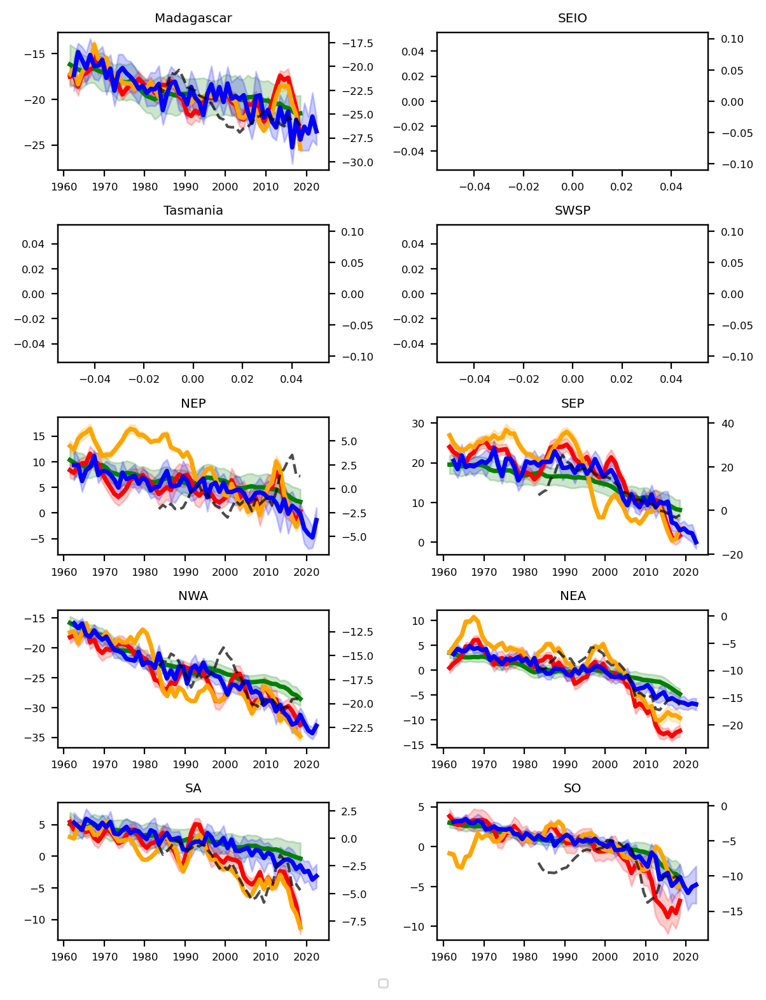

In [29]:
def process_point(ax, ax2, point, cfg_var, le_data, oda_data, ada_data, hcst_data, obs_data):
    """특정 지점의 time series를 필터링하고 플로팅"""
    target_lon, target_lat = point
    # target_lon = target_lon % 360

    # 모든 지점에서의 거리 계산
    distances = np.sqrt(
        (le_data.TLONG - target_lon) ** 2 + (le_data.TLAT - target_lat) ** 2
    )

    # 전체 배열에서 가장 가까운 지점의 인덱스 찾기
    flat_idx = distances.argmin()
    lat_idx, lon_idx = np.unravel_index(flat_idx, distances.shape)

    # 디버깅 출력
    print(f"Target point: lon={target_lon}, lat={target_lat}")
    print(f"Closest point indices: lon_idx={lon_idx}, lat_idx={lat_idx}")
    print(f"Closest point coordinates: lon={le_data.TLONG[lat_idx, lon_idx].values}, lat={le_data.TLAT[lat_idx, lon_idx].values}")

    # plot_time_series 호출
    plot_time_series_point(ax, ax2, lon_idx, lat_idx, le_data, oda_data, ada_data, hcst_data, obs_data, cfg_var)

def plot_time_series_point(ax, ax2, lon_idx, lat_idx, le_time_series_data, oda_time_series_data, ada_time_series_data, hcst_time_series_data, obs_time_series_data, cfg_var):
    """한 subplot에 대한 time series 및 fill_between 플롯 생성"""
    # LE 데이터
    le_point = le_time_series_data.isel(nlon=lon_idx, nlat=lat_idx).mean(dim='ens_LE')[cfg_var.var].squeeze()
    le_std = le_time_series_data.isel(nlon=lon_idx, nlat=lat_idx).std(dim='ens_LE')[cfg_var.var].squeeze()

    # # 차원 확인
    # print("LE point shape:", le_point.shape)
    # print("LE std shape:", le_std.shape)

    # fill_between 호출 전에 차원 확인
    if le_point.ndim > 1 or le_std.ndim > 1:
        raise ValueError("LE point data or standard deviation is not 1-dimensional")

    # fill_between을 사용한 플롯
    ax.fill_between(le_time_series_data.year.values, 
                    le_point.values - le_std.values,
                    le_point.values + le_std.values,
                    color='green', alpha=0.2)
    ax.plot(le_time_series_data.year.values, le_point.values, color='green', linewidth=2.5)

    print(f"LE_values: values={le_point.values}")

    # 동일한 방식으로 ODA, ADA, HCST, OBS 처리
    oda_point = oda_time_series_data.isel(nlon=lon_idx, nlat=lat_idx).mean(dim='ens_ODA')[cfg_var.var].squeeze()
    oda_std = oda_time_series_data.isel(nlon=lon_idx, nlat=lat_idx).std(dim='ens_ODA')[cfg_var.var].squeeze()
    ax.fill_between(oda_time_series_data.year.values, 
                    oda_point.values - oda_std.values,
                    oda_point.values + oda_std.values,
                    color='red', alpha=0.2)
    ax.plot(oda_time_series_data.year.values, oda_point.values, color='red', linewidth=2.5)

    ada_point = ada_time_series_data.isel(nlon=lon_idx, nlat=lat_idx).mean(dim='ens_ADA')[cfg_var.var].squeeze()
    ada_std = ada_time_series_data.isel(nlon=lon_idx, nlat=lat_idx).std(dim='ens_ADA')[cfg_var.var].squeeze()
    ax.fill_between(ada_time_series_data.year.values, 
                    ada_point.values - ada_std.values,
                    ada_point.values + ada_std.values,
                    color='orange', alpha=0.2)
    ax.plot(ada_time_series_data.year.values, ada_point.values, color='orange', linewidth=2.5)

    hcst_point = hcst_time_series_data.isel(nlon=lon_idx, nlat=lat_idx).mean(dim='ens_HCST').squeeze()
    hcst_std = hcst_time_series_data.isel(nlon=lon_idx, nlat=lat_idx).std(dim='ens_HCST').squeeze()
    ax.fill_between(hcst_time_series_data.year.values, 
                    hcst_point.values - hcst_std.values,
                    hcst_point.values + hcst_std.values,
                    color='blue', alpha=0.2)
    ax.plot(hcst_time_series_data.year.values, hcst_point.values, color='blue', linewidth=2.5)

    obs_point = obs_time_series_data.isel(nlon=lon_idx, nlat=lat_idx)[cfg_var.var].squeeze()
    ax2.plot(obs_time_series_data.year.values, obs_point.values, 
             color='black', alpha=0.7, linewidth=1.5, linestyle='--')

    # y축 범위 조정
    ymin, ymax = ax2.get_ylim()
    ax2.set_ylim(ymin - (ymax - ymin) / 2, ymax + (ymax - ymin) / 2)



# 특정 지점 설정 (예: 위도 10, 경도 50)
# points = {
#     "Madagascar": (60, -25),  # (lon, lat)
#     "SEIO": (110, -33),
#     "Tasmania": (150, -42),
#     "SWSP": (170, -15),
#     "NEP": (-120, 17),
#     "SEP": (-93, -18),
#     "NWA": (-60, 35),
#     "NEA": (-40, 15),
#     "SA": (-30, -28),
#     "SO": (-15, -47),
# }
points = {
    "Madagascar": (60, -25),  # (lon, lat)
    "SEIO": (108, -34),
    "Tasmania": (151, -42),
    "SWSP": (170, -15),
    "NEP": (240, 19),
    "SEP": (267, -18),
    "NWA": (301, 34),
    "NEA": (320, 15),
    "SA": (330, -28),
    "SO": (345, -47),
}

# 그림 생성
# fig, ax = plt.subplots(nrows=len(points), ncols=1, figsize=(6, 4*len(points)), dpi=200)
fig, ax = plt.subplots(nrows=5, ncols=2, figsize=(6, 6*1.414), dpi=200, constrained_layout=False)

for idx, (point_name, point_coords) in enumerate(points.items()):
    i, j = divmod(idx, 2)
    ax2 = ax[i, j].twinx()  # 새로운 축 생성
    process_point(ax[i, j], ax2, point_coords, cfg_var, le_full_rolling_mean_masked,
                  oda_full_rolling_mean_masked.isel(ens_ODA=slice(10, 20)),
                  ada_full_rolling_mean_masked,
                  hcst_full_ly2_5_annual_mean_masked.isel(ens_HCST=slice(10, 20)),
                  obs_rolling_mean_masked)
    ax[i, j].set_title(point_name)

# Legend
lines_ax, labels_ax = ax[0,0].get_legend_handles_labels()
lines_ax2, labels_ax2 = ax2.get_legend_handles_labels()
fig.legend(lines_ax + lines_ax2, labels_ax + labels_ax2, loc='upper center', bbox_to_anchor=(0.5, 0), ncol=2)

plt.tight_layout(rect=[0, 0, 1, 0.9])
plt.subplots_adjust(hspace=0.4, wspace=0.4)
plt.show()


Target point: lon=60, lat=-25
Closest point indices: lon_idx=88, lat_idx=102
Closest point coordinates: lon=59.5625016574775, lat=-25.097725426393733
Target point: lon=108, lat=-34
Closest point indices: lon_idx=131, lat_idx=85
Closest point coordinates: lon=107.93750300363452, lat=-33.810890453876425
Target point: lon=151, lat=-42
Closest point indices: lon_idx=169, lat_idx=70
Closest point coordinates: lon=150.68750419326165, lat=-41.82458618467137
Target point: lon=170, lat=-15
Closest point indices: lon_idx=186, lat_idx=131
Closest point coordinates: lon=169.81250472546324, lat=-14.866167536224738
Target point: lon=240, lat=19
Closest point indices: lon_idx=248, lat_idx=253
Closest point coordinates: lon=239.65127946577803, lat=19.15717011943143
Target point: lon=267, lat=-18
Closest point indices: lon_idx=272, lat_idx=120
Closest point coordinates: lon=266.5625074177773, lat=-18.144994846960564
Target point: lon=301, lat=34
Closest point indices: lon_idx=302, lat_idx=288
Closest p

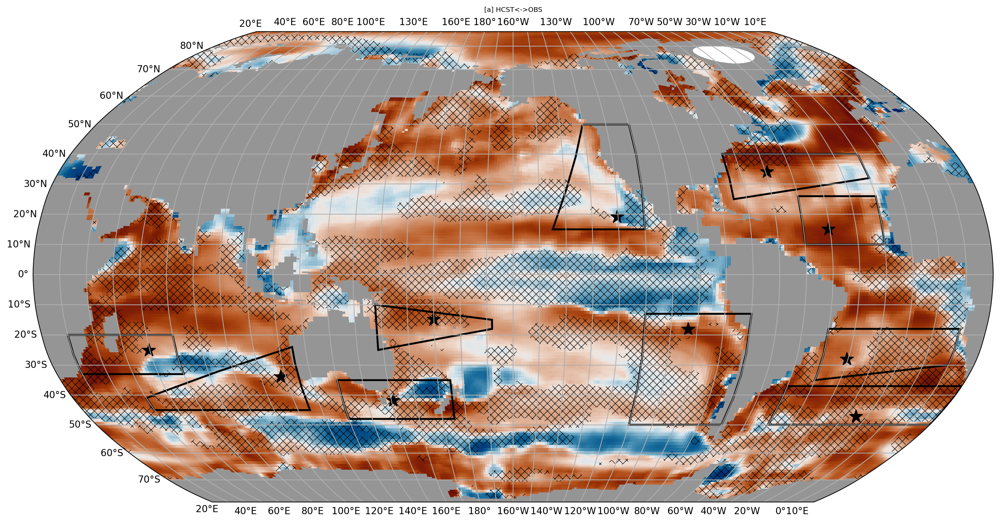

elasped time for plot: 18.841232538223267


In [30]:
# practice for panels (with boxes)

start_time = time.time()

varn=cfg_var.var #example

# data_array=corr_HCST.mean(dim='ens_HCST')
data_array=corr_HCST_ly2_5.median(dim='ens_HCST')

mask_land = np.isnan(data_array)  # 육지(NaN인 지역)
mask_land_numeric = mask_land.astype(int)
# data_array = data_array.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
# mask_land_sat = mask_land.where(cfg_var.OBS_ds['mask_80_percent'] == True, np.nan)
data_array.attrs['name'] = cfg_var.var
if cfg_var.var == 'SST':
    data_array = data_array.where(data_array != 0, np.nan)
if cfg_var.comp=='ocn':
    data_array['TLONG']=ds_grid.TLONG
    data_array['TLAT']=ds_grid.TLAT
    mask_land_numeric['TLONG']=ds_grid.TLONG
    mask_land_numeric['TLAT']=ds_grid.TLAT

if cfg_var.comp=='ocn':
    ds_grid = pop_tools.get_grid('POP_gx1v7')

projection = ccrs.Robinson(central_longitude=200)
cbar_kwargs={'orientation':'horizontal','pad':0.05,'shrink':0.7, 'label':' R ', 'aspect':33, 'extend': 'both'}

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(18.5, 9), 
             dpi=200, facecolor='w', edgecolor='k', subplot_kw={'projection': projection}, constrained_layout=False)

# significant mask for ODA-LE corr > 0 
alpha = 0.10
t_stat_ODA, p_values_ODA = ttest_1samp(corr_ODA_diff, 0, axis=0)
ds_ODA = corr_ODA_diff.mean(dim='ens_ODA').where(p_values_ODA < alpha)
threshold = 0
mask_ODA = ds_ODA > threshold
mask_ODA_indices = np.where(mask_ODA)

HCST_data_array_masked = data_array.where(mask_ODA)

# 그리드 간격 설정 (예: 5씩 건너뛰기)
grid_spacing = 1
mask_not_ODA_land = ~mask_ODA & ~mask_land  # mask_ODA가 False이면서 육지가 아닌 지역
not_valid_indices = np.where(mask_not_ODA_land)
coarse_not_valid_indices = (not_valid_indices[0][::grid_spacing], not_valid_indices[1][::grid_spacing])

plt1=pop_add_cyclic(data_array).plot.pcolormesh(x='TLONG', y='TLAT', 
                ax=axes, transform=ccrs.PlateCarree(), vmax=1, vmin=-1,cmap=cm.vik, add_colorbar=False)
hatch1 = pop_add_cyclic(data_array.where(~mask_ODA, np.nan)).plot.contourf(x='TLONG', y='TLAT', 
                    ax=axes, transform=ccrs.PlateCarree(), levels=[0,1], alpha=0, colors = 'none', hatches=['xxx'], add_colorbar=False) # works very well

land1 = pop_add_cyclic(mask_land_numeric.where(mask_land_numeric == 1, np.nan)).plot.pcolormesh(ax = axes, x='TLONG', y='TLAT', 
                  transform=ccrs.PlateCarree(), cmap='Greys', add_colorbar=False)

# axes.gridlines(draw_labels=True) 
# axes.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0f}°'))
# axes.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'{y:.0f}°'))

# 경도, 위도 그리드라인 추가
gridlines = axes.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

# 10도 간격으로 그리드 설정
gridlines.xlocator = mticker.FixedLocator(np.arange(-180, 181, 10))  # 경도는 -180도에서 180도까지 10도 간격
gridlines.ylocator = mticker.FixedLocator(np.arange(-90, 91, 10))    # 위도는 -90도에서 90도까지 10도 간격

# 그리드 라벨 포맷 지정 (위도, 경도 포맷)
gridlines.xlabel_style = {'size': 10, 'color': 'black'}
gridlines.ylabel_style = {'size': 10, 'color': 'black'}

axes.set_title('[a] HCST<->OBS')


# 1. Madagascar
trapezoid_coords = [
    [30.0, -33],  # 왼쪽 아래
    [70, -33],  # 오른쪽 아래
    [70, -20],  # 오른쪽 위
    [30, -20]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#2. SEIO
trapezoid_coords = [
    [50, -45],  # 왼쪽 아래
    [115, -45],  # 오른쪽 아래
    [115, -24],  # 오른쪽 위
    [50, -41]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#3. Tasmania
trapezoid_coords = [
    [130, -48],  # 왼쪽 아래
    [175, -48],  # 오른쪽 아래
    [175, -35],  # 오른쪽 위
    [130, -35]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#4. SWSP
trapezoid_coords = [
    [148, -25],  # 왼쪽 아래
    [192, -18],  # 오른쪽 아래
    [192, -15],  # 오른쪽 위
    [148, -10]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#5. NEP
trapezoid_coords = [
    [215, 15],  # 왼쪽 아래
    [250, 15],  # 오른쪽 아래
    [250, 50],  # 오른쪽 위
    [230, 50]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#6. SEP
trapezoid_coords = [
    [250, -50],  # 왼쪽 아래
    [290, -50],  # 오른쪽 아래
    [290, -13],  # 오른쪽 위
    [250, -13]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#7. NWA
trapezoid_coords = [
    [-75, 25],  # 왼쪽 아래
    [-20, 32],  # 오른쪽 아래
    [-20, 40],  # 오른쪽 위
    [-75, 40]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#8. NEA
trapezoid_coords = [
    [-50, 10],  # 왼쪽 아래
    [-20, 10],  # 오른쪽 아래
    [-20, 26],  # 오른쪽 위
    [-50, 26]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)

#9. SA
trapezoid_coords = [
    [-40, -35],  # 왼쪽 아래
    [10, -30],  # 오른쪽 아래
    [10, -18],  # 오른쪽 위
    [-40, -18]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)


#10. SO
trapezoid_coords = [
    [-50, -50],  # 왼쪽 아래
    [20, -50],  # 오른쪽 아래
    [20, -37],  # 오른쪽 위
    [-50, -37]  # 왼쪽 위
]
trapezoid = patches.Polygon(trapezoid_coords, closed=True, linewidth=2, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree())
axes.add_patch(trapezoid)


# 결과를 저장할 리스트
points_model_indices = {}  # 각 point_name에 대해 (lon_idx, lat_idx) 저장
points_model_coordinates = {}  # 각 point_name에 대해 (model_lon, model_lat) 저장

def process_point(point, cfg_var, le_data):
    """특정 지점의 time series를 필터링하고 플로팅"""
    target_lon, target_lat = point

    # 모든 지점에서의 거리 계산
    distances = np.sqrt(
        (le_data.TLONG - target_lon) ** 2 + (le_data.TLAT - target_lat) ** 2
    )

    # 전체 배열에서 가장 가까운 지점의 인덱스 찾기
    flat_idx = distances.argmin()
    lat_idx, lon_idx = np.unravel_index(flat_idx, distances.shape)

    # 모델 상의 좌표
    model_lon = le_data.TLONG[lat_idx, lon_idx].values
    model_lat = le_data.TLAT[lat_idx, lon_idx].values

    # 디버깅 출력
    print(f"Target point: lon={target_lon}, lat={target_lat}")
    print(f"Closest point indices: lon_idx={lon_idx}, lat_idx={lat_idx}")
    print(f"Closest point coordinates: lon={model_lon}, lat={model_lat}")

    # 결과 저장
    points_model_indices[point_name] = (lon_idx, lat_idx)
    points_model_coordinates[point_name] = (model_lon, model_lat)


for idx, (point_name, point_coords) in enumerate(points.items()):
    i, j = divmod(idx, 2)
    process_point(point_coords, cfg_var, le_full_rolling_mean_masked)



# points_model_coordinates["Madagascar"]
# points_model_coordinates["SEIO"]
# points_model_coordinates["Tasmania"]
# points_model_coordinates["SWSP"]
# points_model_coordinates["NEP"]
# points_model_coordinates["SEP"]
# points_model_coordinates["NWA"]
# points_model_coordinates["NEA"]
# points_model_coordinates["SA"]
# points_model_coordinates["SO"]

# 포인트를 맵에 표시하는 함수
def add_markers_to_map(axes, coordinates, marker='*', color='black', size=200):
    """points_model_coordinates에 저장된 포인트를 맵에 마커로 추가"""
    for point_name, (model_lon, model_lat) in coordinates.items():
        axes.scatter(
            model_lon, model_lat, transform=ccrs.PlateCarree(),
            marker=marker, color=color, s=size, label=point_name
        )
        # 디버깅 출력
        print(f"Added marker for {point_name} at ({model_lon}, {model_lat})")

# 포인트를 맵에 마커로 추가
add_markers_to_map(axes, points_model_coordinates, marker='*', color='black', size=200)

# 레전드 추가
# axes.legend(loc='lower left', fontsize=8, title='Regions')

plt.show()

end_time = time.time()
elapsed_time = end_time - start_time
print('elasped time for plot: ' + str(elapsed_time))